# DESI Stream Tutorial

Welcome to the 2025 version of our stellar stream characterization tutorial notebook. This notebook will walk you through using data from the DESI Milky Way Survey data from the first full public release. For more information on the DESI DR1 stellar catalogue from the Milky Way Survey, see the `README.md` file.

Coments like the one below highlight the pieces of code you're expected to tweak in your search for stellar streams.

```python
#---------------------------------#

Example_variable = 1000000000000e10 #Look here for stuff to change throughout the notebook!

#---------------------------------#
```


Below, we're going to import the packages we'll be using.



In [1]:
import sys
from pathlib import Path
import os
import pandas as pd
SCRIPTS = Path().resolve() / "libraries"
if str(SCRIPTS) not in sys.path:
    sys.path.insert(0, str(SCRIPTS))
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import scipy.stats as stats
from astropy.io import fits
from astropy import table
import matplotlib
import matplotlib.patheffects as path_effects
import importlib
import stream_functions as stream_funcs
importlib.reload(stream_funcs)
import emcee
import corner
from astropy.table import Table
from astropy import units as u
from collections import OrderedDict
import time
from scipy import optimize, stats
import matplotlib.colors as mcolors
colors = mcolors.CSS4_COLORS
color_names = list(colors.keys())
import streamTutorial as st
import copy
importlib.reload(st);


Next, let's input our DESI MWS DR1 data. 

In [2]:
importlib.reload(st)
# Add the path to the DESI data and STREAMFINDER data below

# local = true is for my personal data paths, set local to false and set paths.
#---------------------------------#
local = False
note = "test" + str(local)
desi_path = '/raid/DESI/catalogs/loa/rv_output/241119/rvpix-loa.fits' if not local else '/Users/nasserm/Documents/vscode/data/old_photometry_loa_cleaned_051125.fits' # '/Users/nasserm/Documents/vscode/research/streamTut/DESI-DR1_streamTutorial/data/newphotometry_loa.fits'# './data/cleaned_loa_15_09_2025.fits' #'/raid/DESI/catalogs/loa/rv_output/241119/rvpix-loa.fits' # './data/cleaned_loa_15_09_2025.fits'  #/Users/nasserm/Documents/vscode/research/streamTut/DESI-DR1_streamTutorial/data/newphotometry_loa.fits
sf_path =  '/home/jupyter-nasserm/raid/nasserm/data/streamfinder_gaiadr3.fits' if not local else '/Users/nasserm/Documents/vscode/research/streamTut/DESI_streamTutorial/data/streamfinder_gaiadr3.fits'
sf3_table = pd.read_csv('/home/jupyter-jtang/jtang/Nasser_and_Joseph/sf3_only_table.csv') if not local else pd.read_csv('/Users/nasserm/Documents/vscode/research/streamTut/DESI_streamTutorial/data/sf3_only_table.csv')  
rvs_distance_path = '/raid/DESI/catalogs/loa/rv_output/distance/rvsdistnn-loa-250218.fits' if not local else '/Users/nasserm/Documents/vscode/research/data/rvsdistnn-loa-250218.fits'
decals_path = '/raid/DESI/catalogs/loa/rv_output/241119/legacyphot-loa-241126.fits'
#---------------------------------#

Data = st.Data(desi_path, sf_path, cleaned_data=local, dist_path=rvs_distance_path, decals_path=decals_path)

Data.desi_data['VGSR'] = stream_funcs.vhel_to_vgsr(
    np.array(Data.desi_data['TARGET_RA']) * u.deg,
    np.array(Data.desi_data['TARGET_DEC']) * u.deg,
    np.array(Data.desi_data['VRAD']) * (u.km / u.s),
).value

#                 stream_funcs.vhel_to_vgsr(
            #         np.array(self.sf_data['RAdeg']) * u.deg,
            #         np.array(self.sf_data['DEdeg']) * u.deg,
            #         np.array(self.sf_data['VHel']) * (u.km / u.s),
            #     ).value
            # )

print('Now our desi data has been loaded under Data.desi_data')


#      _______
#    (  ^   ^  )👍
#     |   ~   |
#     |_______|
#   ~ "Well done!"

Length of DESI Data before Cuts: 15947824
Length after NaN cut: 9429133
RVS distances added
Now our desi data has been loaded under Data.desi_data


# Pick Stream

We'll pick a stream to work with by entering it in 
```python 
#---------------------------------#
st.stream(Data, streamName='SoI-I21')
#---------------------------------#
```

Initializing this stream object will add an attribute to the `Data` object, accessed either through

`Data.confirmed_sf_and_desi` or `SoI.data.confirmed_sf_and_desi`

Here is the table to reference in picking your stream:

In [10]:
list_streams= pd.read_csv("data/sf3_only_table.csv")

# print(list_streams.drop(columns=["streamname", "Distance_kpc"]).iloc[:, 2:].to_markdown(index=False))

In [12]:
streams_good = ["C-25-I24", "C-11-I24", "New-7-I24", "NGC3201-P21", "Slidr-I21", "Sylgr-I21", "M68-P19", "Orphan-K23", "C-23-I24", "GD-1-I21", "Gaia-6-I21", "Pal5-I21", "Gaia-9-I21", "Phlegethon-I21", "M92-I21", "Svol-I21", "M5-G19", "Gaia-1-I21", "New-6-I24", "New-15-I24", "C-9-I24", "C-10-I24"]

list_streams2 = list_streams[list_streams['Galstream Stream name'].isin(streams_good)]

In [13]:
list_streams2

,Unnamed: 0.1,Unnamed: 0,SF3 Stream Index,Stream,# SF3 Stars,# SF3 Stars in DESI,# of SF3 Stars with VHel,Galstream Stream name,Metallicities,streamname,Distance_kpc
8,8,22,22,New-6,146.0,12.0,12.0,New-6-I24,-2.18,NaN,NaN
9,9,24,24,C-25,121.0,40.0,25.0,C-25-I24,-2.30,NaN,NaN
10,10,25,25,C-11,112.0,33.0,9.0,C-11-I24,-2.91,NaN,NaN
11,11,27,27,New-7,37.0,15.0,11.0,New-7-I24,-2.23,NaN,NaN
14,14,30,30,C-10,158.0,49.0,5.0,C-10-I24,-0.91,NaN,NaN
18,18,34,34,Gjoll,607.0,18.0,40.0,NGC3201-P21,-1.63,NaN,NaN
19,19,35,35,C-9,183.0,70.0,35.0,C-9-I24,-0.72,NaN,NaN
21,21,39,39,Slidr,330.0,148.0,34.0,Slidr-I21,-1.70,Slidr,2.4
23,23,42,42,Sylgr,256.0,109.0,33.0,Sylgr-I21,-2.92,Sylgr,2.4
24,24,43,43,New-15,152.0,74.0,23.0,New-15-I24,-2.01,NaN,NaN


In [15]:
list_streams2['Distance_kpc'].max()

15.9

We can see all of these stream on the DESI footprint:

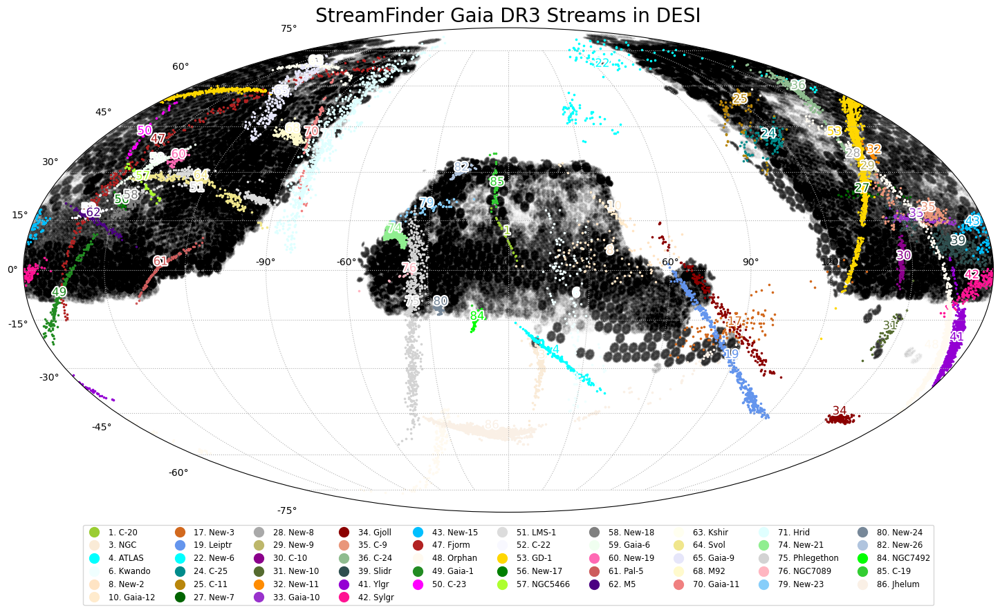

In [6]:
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111, projection='mollweide')

desi_ra_data = stream_funcs.zero_360_to_180(np.array(Data.desi_data['TARGET_RA']))
s = plt.scatter(np.deg2rad(desi_ra_data), np.deg2rad(Data.desi_data['TARGET_DEC']), s = 0.005, alpha = 0.2, c='k', marker='.')

for i, stream in zip(np.array(sf3_table['SF3 Stream Index'].values), sf3_table['Stream']):
    sf3_stream = Data.sf_data[Data.sf_data['Stream'] == i]
    ra_data = stream_funcs.zero_360_to_180(np.array(sf3_stream['RAdeg'].values))
    plt.scatter(np.deg2rad(ra_data), np.deg2rad(np.array(sf3_stream['DEdeg'].values)), label=f'{i}. {stream}', marker='.', color=color_names[i-2], s=10)
    
    # Annotate the plot with the stream number
    median_ra = np.median(np.deg2rad(ra_data))
    median_dec = np.median(np.deg2rad(np.array(sf3_stream['DEdeg'].values)))
    txt = ax.annotate(f'{i}', (median_ra, median_dec), textcoords="offset points", xytext=(2,2), ha='center', color=color_names[i-2], fontsize=12)
    txt.set_path_effects([path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()])

ax.grid(ls=':')

# Create a custom legend with larger dots
handles, labels = ax.get_legend_handles_labels()
new_handles = [plt.Line2D([], [], marker='o', color=color_names[i-2], linestyle='', markersize=10) for i, h in zip(np.array(sf3_table['SF3 Stream Index'].values), handles)]

ax.legend(handles=new_handles, labels=labels, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=10, fontsize='small')

plt.title('StreamFinder Gaia DR3 Streams in DESI', fontsize=20)


plt.tight_layout()
plt.show()

We can also have a look at streams that aren't in STREAMFINDER using the galstreams catalogue.
Lets load a .csv that has information on streams in galstreams that isn't in STREAMFINDER.

In [7]:
galstream_table = pd.read_csv('./data/galstream_desi_table.csv')
print('number of galstream streams not in STREAMFINDER:', len(galstream_table))

number of galstream streams not in STREAMFINDER: 31


In [8]:
import galstreams
mwsts = galstreams.MWStreams(verbose=False, implement_Off=True)

Initializing galstreams library from master_log... 


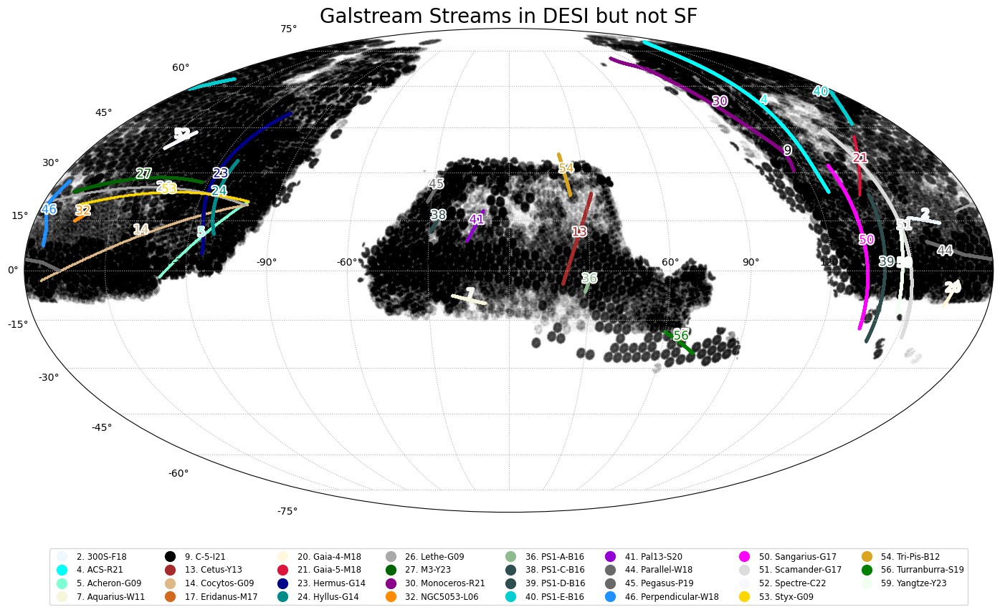

In [9]:
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111, projection='mollweide')

desi_ra_data = stream_funcs.zero_360_to_180(np.array(Data.desi_data['TARGET_RA']))
s = plt.scatter(np.deg2rad(desi_ra_data), np.deg2rad(Data.desi_data['TARGET_DEC']), s = 0.005, alpha = 0.2, c='k', marker='.')

for i, stream in zip(np.array(galstream_table['Unnamed: 0']), galstream_table['Stream']):
    gal_stream_data = mwsts[stream]
    ra_data = stream_funcs.zero_360_to_180(gal_stream_data.track.ra.deg)
    plt.scatter(np.deg2rad(ra_data), np.deg2rad(gal_stream_data.track.dec.deg), label=f'{i}. {stream}', marker='.', color=color_names[i-2], s=10)
    
    # Annotate the plot with the stream number
    median_ra = np.median(np.deg2rad(ra_data))
    median_dec = np.median(np.deg2rad(gal_stream_data.track.dec.deg))
    txt = ax.annotate(f'{i}', (median_ra, median_dec), textcoords="offset points", xytext=(2,2), ha='center', color=color_names[i-2], fontsize=12)
    txt.set_path_effects([path_effects.Stroke(linewidth=3, foreground='white'), path_effects.Normal()])

ax.grid(ls=':')

# Create a custom legend with larger dots
handles, labels = ax.get_legend_handles_labels()
new_handles = [plt.Line2D([], [], marker='o', color=color_names[i-2], linestyle='', markersize=10) for i, h in zip(np.array(galstream_table['Unnamed: 0']), handles)]

ax.legend(handles=new_handles, labels=labels, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=8, fontsize='small')
plt.title('Galstream Streams in DESI but not SF', fontsize=20)


plt.tight_layout()
plt.show()

#### Whats the Difference?

STREAMFINDER is an algorithm by Khyati Malhan and Rodrigo A. Ibata (2018) used to discover cold and thin structures that lay upon simple or complex orbits. We're using the stream members identified by STREAMFINDER when applied to *Gaia* DR3. 

galstreams, on the otherhand, is a compiled catalogue of stream tracks. You can find the source/references for each stream in galstreams by using 

```some_galstream_stream.ref_discovery```

For example:

In [10]:
gstream_ = mwsts.get('Slidr-I24')
gstream_.ref_discovery, gstream_.ref

('Ibata2019', 'ibata2024')

Said tracks can be accessed using

In [11]:
gstream_.track.ra # for example, most have 3D to 6D track information

<Longitude [144.97313165, 144.98151208, 144.98989323, ..., 178.30261338,
            178.31112845, 178.31964257] deg>

## Initialize stream

In [12]:
importlib.reload(stream_funcs)
from gala.coordinates import GreatCircleICRSFrame
import astropy.coordinates as coord

#---------------------------------#
streamName= 'Gaia-9-I21' #'Sylgr-I21'
custom_frame = None
#---------------------------------#

importlib.reload(st)
SoI = st.stream(Data, streamName, custom_frame=custom_frame)

Found stream 'Gaia-9-I21' in SF3 with index 65
Importing galstreams module...
Initializing galstreams library from master_log... 


Using galstreams track for 'Gaia-9-I21' (min dist ~ 3.777 kpc).
Creating combined DataFrame of SF and DESI
No original data available for comparison - cut_confirmed_sf_and_desi is empty
Number of stars in SF: 233, Number of DESI and SF stars: 77
Saved merged DataFrame as self.data.confirmed_sf_and_desi
Stars only in SF3: 155


In [13]:
SoI.data.SoI_galstream.ref_discovery

'Ibata2021'

In [14]:
# Galstreams/SF3 helper
import pandas as pd, numpy as np

gal_only = (getattr(SoI.data, "SoI_streamfinder", None) is None) or (len(SoI.data.SoI_streamfinder) == 0)

if gal_only:
    SoI.data.SoI_streamfinder = pd.DataFrame({"RAdeg": [], "DEdeg": [], "phi1": [], "phi2": []})

track_df = None
if getattr(SoI.data, "SoI_galstream", None) is not None:
    g = SoI.data.SoI_galstream
    track_df = pd.DataFrame({
        "RAdeg": g.track.ra.to_value("deg"),
        "DEdeg": g.track.dec.to_value("deg"),
        "phi1": g.gal_phi1,
        "phi2": g.gal_phi2,
    })

ref_ra   = track_df["RAdeg"] if (gal_only and track_df is not None) else SoI.data.SoI_streamfinder["RAdeg"]
ref_dec  = track_df["DEdeg"] if (gal_only and track_df is not None) else SoI.data.SoI_streamfinder["DEdeg"]
ref_phi1 = track_df["phi1"]  if (gal_only and track_df is not None) else SoI.data.SoI_streamfinder["phi1"]
ref_phi2 = track_df["phi2"]  if (gal_only and track_df is not None) else SoI.data.SoI_streamfinder["phi2"]

print(f"gal_only={gal_only}, reference points={len(ref_ra)}")

gal_only=False, reference points=233


Let us take a look at our stellar stream below:

#### Figure 1a

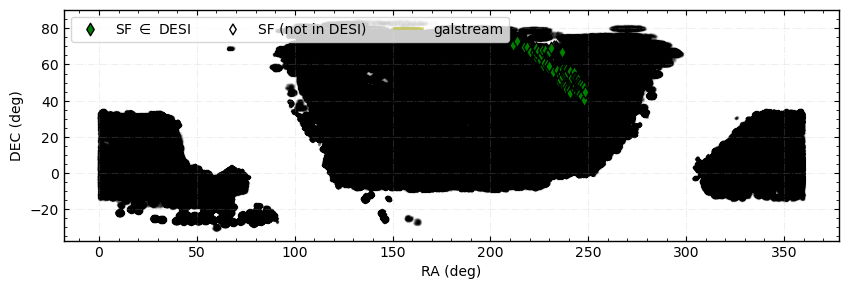

In [15]:
importlib.reload(st)
plt_soi = st.StreamPlotter(SoI)

plt_soi.on_sky(stream_frame=False, background=True)

We also calculated the *stream coordinates* $\phi_1$ and $\phi_2$. This is achieved by rotating the right ascension and declination such that the length of the stream lies along $\phi_2 \sim 0$, and the center of the stream is $\phi_1 \sim 0$.

#### Figure 1b

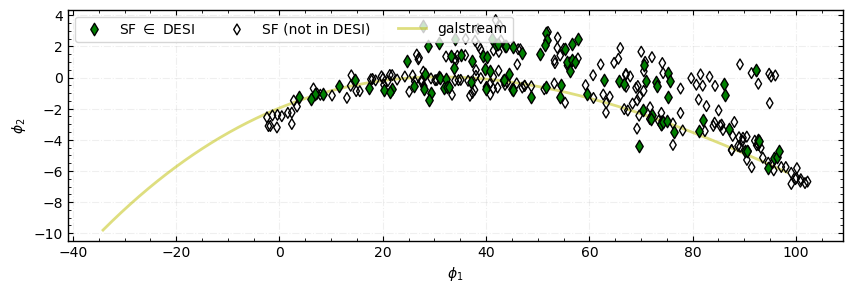

In [35]:
plt_soi.on_sky(stream_frame=True)

Great! Lets move on now.

We have lots of DESI data, lets cut that down with the following steps:
- Perform an RA/DEC cut to remove stars on different parts of the sky
- Perform a distance cut to remove stars too nearby
- Trim stars that are too metal rich
- Trim stars that fall outside of the best-fit stellar population model
- Trim stars with kinematics nothing like the STREAMFINDER stars


# Spatial Cuts
The first two bullet points can be achieved using a handy function we have stored in `stream_functions.py`

`stream_funcs.threeD_max_min_mask`.

In [36]:
importlib.reload(st)
selection_fine = st.Selection(SoI.data.desi_data)

# We want to get the ra and dec from STREAMFINDER stars/galstreams track for this function so we can cut around it

#---------------------------------#
ra_cut = 10 #deg
dec_cut = 10 #deg
#---------------------------------#

selection_fine.add_mask(
    name='3D',
    mask_func=lambda df: stream_funcs.threeD_max_min_mask(
        df['TARGET_RA'],
        df['TARGET_DEC'],
        df['PARALLAX'],
        df['PARALLAX_ERROR'],
        ref_ra,
        ref_dec,
        SoI.min_dist,
        ra_cut,
        dec_cut
    )
)

Selection object created for DataFrame with 9770108 rows.
Mask added: '3D'


Once we've done all our cuts, we can get all our masks in one using `mask = selection_fine.get_masks(['mask 1', ... 'mask n'])`

#### Figure 2

...'3D' selected 1960961 stars
Selection for specified masks: 1960961 / 9770108 stars.
Created cut_confirmed_sf_and_desi with 3 stars that were filtered out
Number of stars in SF: 297, Number of DESI and SF stars: 92
Saved merged DataFrame as self.data.confirmed_sf_and_desi_b
Stars only in SF3: 204


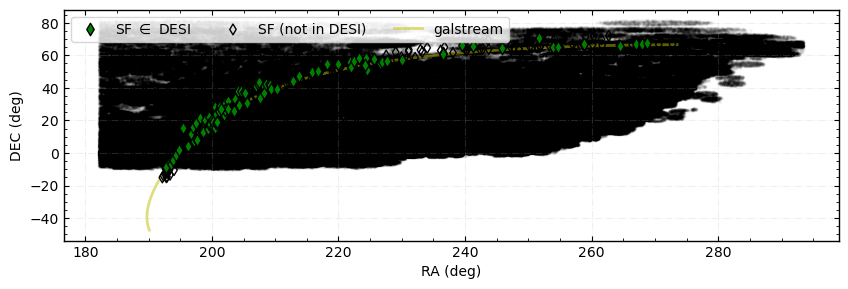

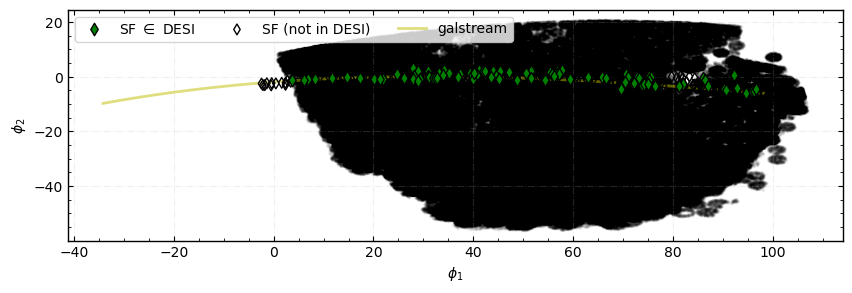

In [37]:
importlib.reload(st)
# Lets take a look at our trimmed DESI data

mask = selection_fine.get_masks(['3D'])

# Using the new method that replaces the 4-line pattern
trimmed_stream = SoI.mask_stream(mask)

plt_trim = st.StreamPlotter(trimmed_stream)
plt_trim.on_sky(showStream=True, background=True, stream_frame=False)
plt_trim.on_sky(showStream=True, background=True)

Lets also look at our parallax cut. We use the calculation of plx - 2 * plx_err < 1/min_dist. This simply gets rid of nearby stars that, after subtracting 2 times the parallax error, are still below minimum parallax.

#### Figure 3

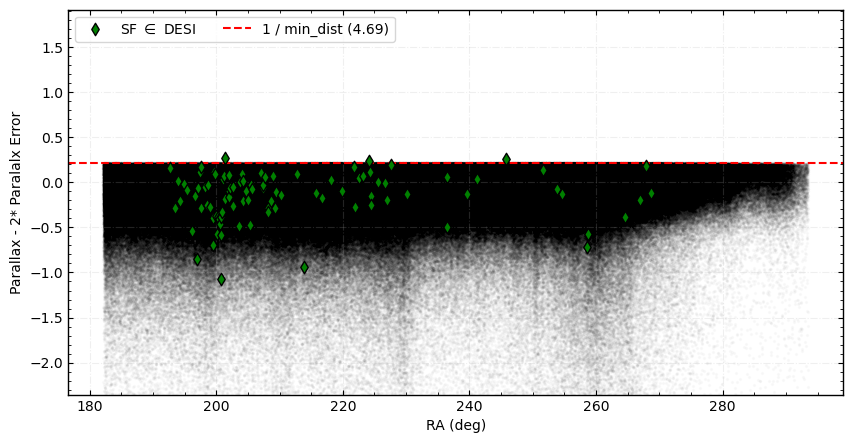

In [38]:
plt_trim.plx_cut()

Now that we've visualized the stream in the stream-frame, we can get a bit more specific with our on-sky cuts. We can narrow in by only keeping stars within some range of $\phi_2$ = 0.

In [141]:
#---------------------------------#
phi2_max = 5#[deg]
phi2_min = -8 #[deg]
#---------------------------------#

selection_fine.add_mask(name='phi2',
        mask_func=lambda df: (df['phi2'] < phi2_max) & (df['phi2'] > phi2_min))


#---------------------------------#
phi1_max = 100 #[deg]
phi1_min = 0 #[deg]
#---------------------------------#

selection_fine.add_mask(name='phi1',
        mask_func=lambda df: (df['phi1'] < phi1_max) & (df['phi1'] > phi1_min))

Mask added: 'phi2'
Mask added: 'phi1'


### Figure 4

...'phi1' selected 6285972 stars
...'phi2' selected 1082117 stars
...'3D' selected 1960961 stars
Selection for specified masks: 338024 / 9770108 stars.
Created cut_confirmed_sf_and_desi with 3 stars that were filtered out
Number of stars in SF: 297, Number of DESI and SF stars: 92
Saved merged DataFrame as self.data.confirmed_sf_and_desi_b
Stars only in SF3: 204
/Users/nasserm/Documents/vscode/research/streamTut/DESI_streamTutorial/libraries/streamTutorial.py:1650: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc='upper left', ncol=4)



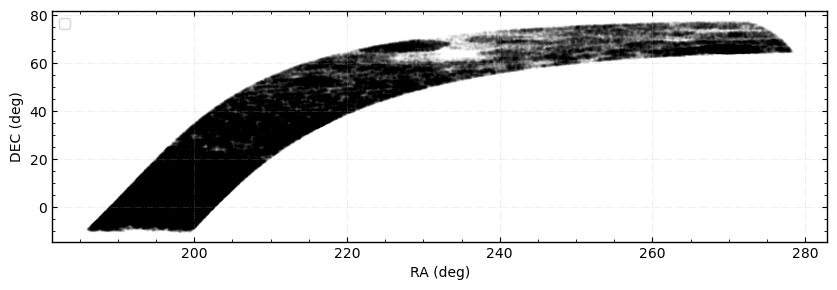

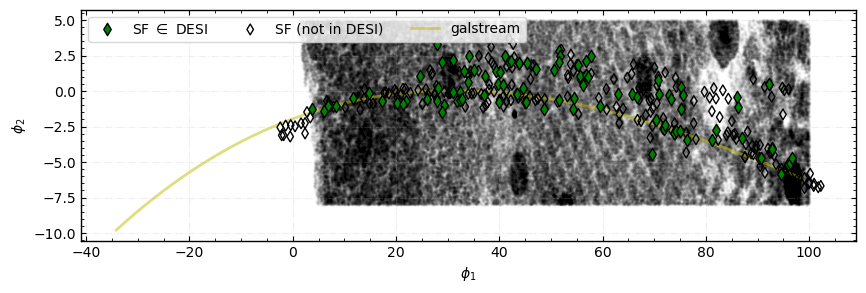

In [142]:
importlib.reload(st)
# Lets take a look at our trimmed DESI data
mask = selection_fine.get_masks(['phi1', 'phi2', '3D'])

trimmed_stream = SoI.mask_stream(mask)

plt_trim = st.StreamPlotter(trimmed_stream)
plt_trim.on_sky(showStream=False, background=True, stream_frame=False)
plt_trim.on_sky(showStream=True, background=True)

In [143]:
from galpy.orbit import Orbit
o = Orbit.from_name("M13")
#---------------------------------#
cut_ra = 270 #[deg]
cut_dec = 66 #[deg]
cut_radius = 1 #[deg]
#---------------------------------#

selection_fine.add_mask(name='punch',
        mask_func=lambda df: ((df['TARGET_RA'] - cut_ra)**2 + (df['TARGET_DEC'] - cut_dec)**2) > cut_radius**2)

#---------------------------------#
cut_ra2 = 227 #[deg]
cut_dec2 = 67 #[deg]
cut_radius2 = 1 #[deg]
#---------------------------------#

selection_fine.add_mask(name='punch2',
        mask_func=lambda df: ((df['TARGET_RA'] - cut_ra2)**2 + (df['TARGET_DEC'] - cut_dec2)**2) > cut_radius2**2)

Mask added: 'punch'
Mask added: 'punch2'


...'3D' selected 1960961 stars
...'phi1' selected 6285972 stars
...'phi2' selected 1082117 stars
...'punch' selected 9766327 stars
...'punch2' selected 9768348 stars
Selection for specified masks: 334715 / 9770108 stars.
Created cut_confirmed_sf_and_desi with 3 stars that were filtered out
Number of stars in SF: 297, Number of DESI and SF stars: 92
Saved merged DataFrame as self.data.confirmed_sf_and_desi_b
Stars only in SF3: 204


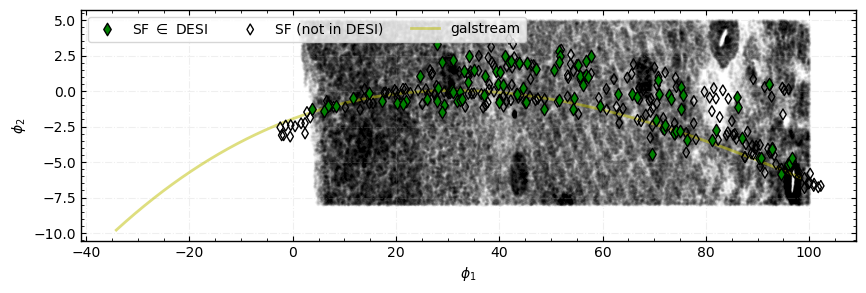

In [144]:
importlib.reload(st)
# Lets take a look at our trimmed DESI data
mask = selection_fine.get_masks(['3D', 'phi1', 'phi2', 'punch', 'punch2'])

trimmed_stream = SoI.mask_stream(mask)

plt_trim = st.StreamPlotter(trimmed_stream)
plt_trim.on_sky(showStream=True, background=True)

Lets also check for any streams in the area we want to be wary of!

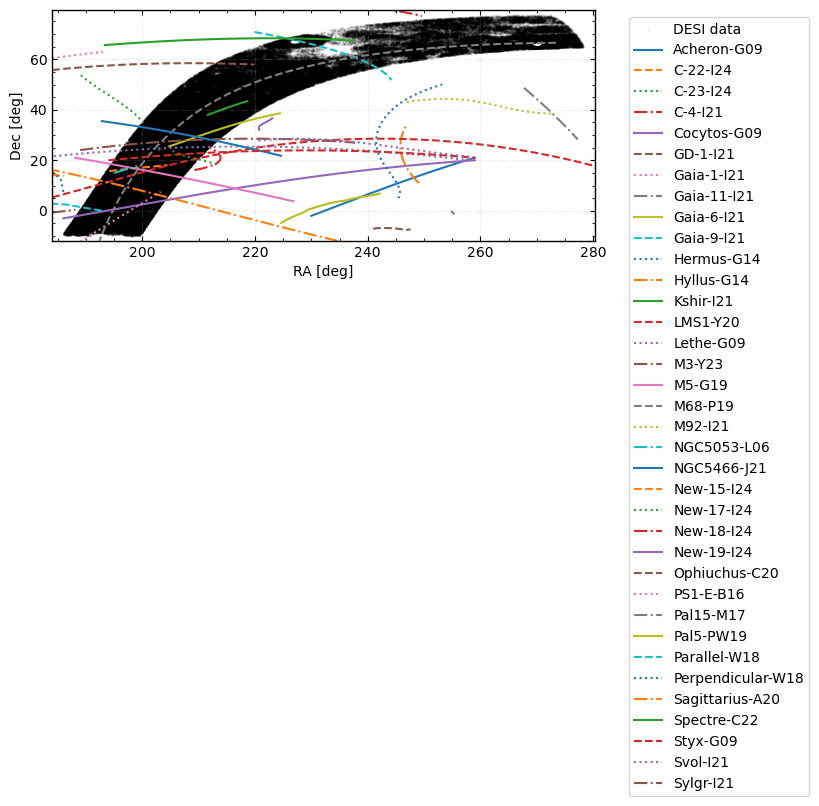

In [145]:
importlib.reload(st)
plt_trim = st.StreamPlotter(trimmed_stream)
fig, ax = plt_trim.plot_galstreams()
# ax.set_xlim(220, 240)
# ax.set_ylim(-60, 60)

# Metallicity Cut
Stars in a stellar stream all share some chemical characteristics, and we can use this to cut down on the contaminents in our field. Lets grab the stream's known metallicity from STREAMFINDER and make a cut using that information.

In [146]:
sf3_table = pd.read_csv('./data/sf3_only_table.csv')


# metallicity = sf3_table['Metallicities'][SoI.streamNo]
metallicity = -2.5 #NOTE Manual override
print(f"{SoI.streamName} Metallicity: {metallicity}")
print(f'Mass Fraction (Z) Guess: {0.0181 * 10 ** metallicity}')


M68-P19 Metallicity: -2.5
Mass Fraction (Z) Guess: 5.723722564904767e-05


#### Figure 5

/opt/anaconda3/envs/streamTutorial/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)



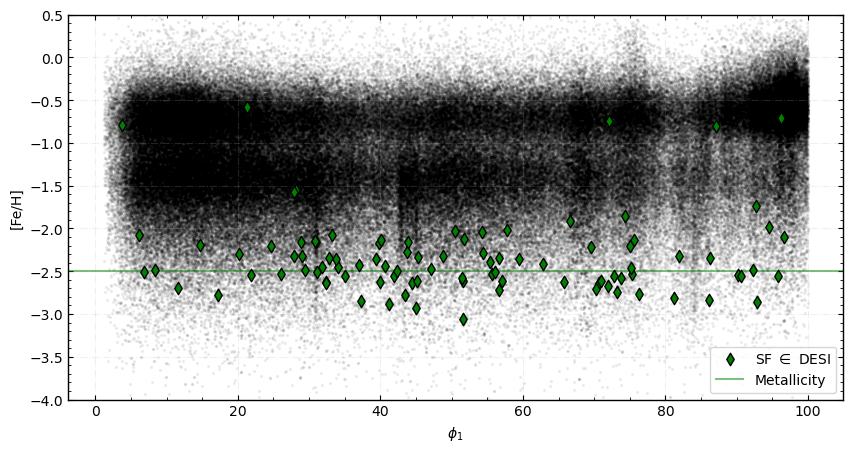

In [147]:
plt_trim.plot_params['background']['alpha']=0.05
plot = plt_trim.feh_plot(showStream=True, background=True)
ax = plot[1]
ax.axhline(metallicity if metallicity is not None else -1, color='g', linestyle='solid', label='Metallicity', alpha=0.5)
ax.legend()

Now lets trim stars that are too metal rich!

In [148]:
#---------------------------------#
feh_cut = -1.5# [dex]
#---------------------------------#

selection_fine.add_mask(name='feh',
        mask_func=lambda df: (df['FEH'] < feh_cut))

Mask added: 'feh'


#### Figure 6

...'3D' selected 1960961 stars
...'phi2' selected 1082117 stars
...'feh' selected 1013623 stars
...'phi1' selected 6285972 stars
...'punch' selected 9766327 stars
...'punch2' selected 9768348 stars
Selection for specified masks: 94602 / 9770108 stars.
Created cut_confirmed_sf_and_desi with 6 stars that were filtered out
Number of stars in SF: 297, Number of DESI and SF stars: 89
Saved merged DataFrame as self.data.confirmed_sf_and_desi_b
Stars only in SF3: 208


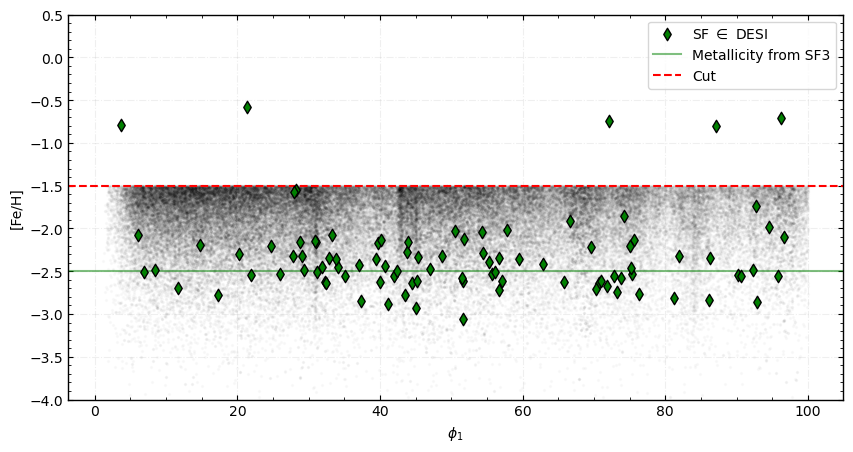

In [149]:
#del trimmed_stream, plt_trim # clear memory
importlib.reload(st)
mask = selection_fine.get_masks(['3D', 'phi2', 'feh', 'phi1', 'punch', 'punch2'])

trimmed_stream = SoI.mask_stream(mask)


plt_trim = st.StreamPlotter(trimmed_stream)
plot = plt_trim.feh_plot(showStream=True, background=True)
ax = plot[1]
ax.axhline(metallicity, color='g', linestyle='solid', label='Metallicity from SF3', alpha=0.5)
ax.axhline(feh_cut, color='red', linestyle='--', label='Cut')
ax.legend(loc='upper right')

# Isochrone Cut

When searching for stellar streams, an isochrone cut helps isolate stars that are likely part of the same stellar population.
Streams originate from disrupted star clusters or dwarf galaxies, whose stars share a common age and chemical composition.
By selecting only stars lying close to a theoretical stellar evolution isochrone (in colour–magnitude space), we suppress contamination from unrelated field stars with different ages and metallicities.

The position of an isochrone in colour-magnitude space depends on the age of the stellar population (~shifts it up and down) and the metallicity (~shifts it left and right)

In [150]:
SoI.min_dist

4.687646092795955

In [151]:
# import gallery_functions as gallery_funcs
# progenitor_ra = np.nanmean(SoI.data.confirmed_sf_and_desi['RAdeg'])
# fw = np.linspace(0., 0.025, 2001) * u.Gyr
# bw = np.linspace(0., -0.025, 2001) * u.Gyr
# distance_guess = SoI.min_dist
# frame = SoI.frame
# results_o1 = gallery_funcs.fit_orbit(SoI.data.confirmed_sf_and_desi, distance_guess, frame, progenitor_ra, fw, bw)

In [152]:
# SoI.min_dist = 7
SoI.dist_override = None
delattr(SoI, "dist_override")
SoI.min_dist
# NOTE you could overwrite this if you had a reason to

4.687646092795955

In [153]:
#---------------------------------#
colour_wiggle = 0.13 # [dex]
age = 13.5 # [Gyr] -> of form 10.0, 10.1, 10.2, etc

metallicity = metallicity# may want to adjust the metallicity of the isochrone manually
#---------------------------------#
SoI.isochrone(metallicity, age=age) 

selection_fine.add_mask(name='iso',
        mask_func=lambda df: (stream_funcs.betw(SoI.data.desi_colour_idx, SoI.isochrone_fit(SoI.data.desi_abs_mag), colour_wiggle)))


Mass Fraction (Z): 5.723722564904767e-05

using ./data/dotter/iso_a13.5_z0.00006.dat
Using distance gradient
/Users/nasserm/Documents/vscode/research/streamTut/DESI_streamTutorial/libraries/stream_functions.py:640: RuntimeWarning: invalid value encountered in log10
  R_mag = r_mag - 5 * np.log10(distances) + 5

Mask added: 'iso'


#### Figure 7

...'3D' selected 1960961 stars
...'phi2' selected 1082117 stars
...'feh' selected 1013623 stars
...'iso' selected 2249393 stars
...'phi1' selected 6285972 stars
...'punch' selected 9766327 stars
...'punch2' selected 9768348 stars
Selection for specified masks: 64612 / 9770108 stars.
Created cut_confirmed_sf_and_desi with 7 stars that were filtered out
Number of stars in SF: 297, Number of DESI and SF stars: 88
Saved merged DataFrame as self.data.confirmed_sf_and_desi_b
Stars only in SF3: 209
Mass Fraction (Z): 5.723722564904767e-05

using ./data/dotter/iso_a13.5_z0.00006.dat
Using distance gradient


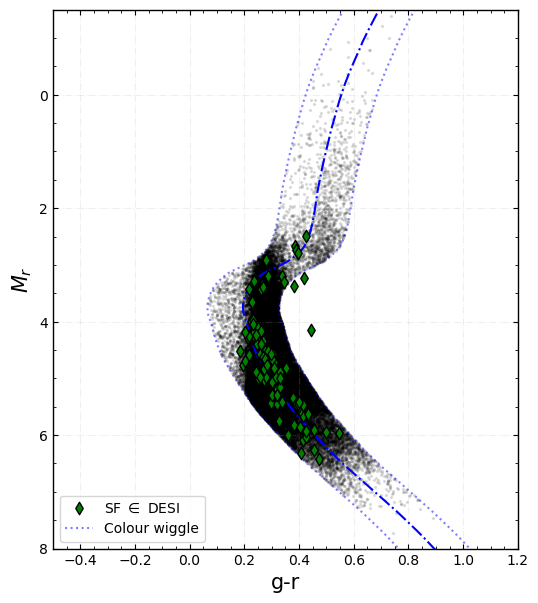

In [160]:
importlib.reload(st)
mask = selection_fine.get_masks(['3D', 'phi2', 'feh', 'iso', 'phi1', 'punch', 'punch2'])

trimmed_stream = SoI.mask_stream(mask)
trimmed_stream.isochrone(metallicity, age=age) 

plt_trim = st.StreamPlotter(trimmed_stream)
plt_trim.plot_params['background']['alpha']=0.1
plt_trim.iso_plot(wiggle=colour_wiggle, background=True, showStream=True)

# Kinematic Cuts

DESI's radial velocity measurements are generally more reliable than from the Gaia RVS data (which the STREAMFINDER Catalogue is based off of). We may see some obvious outliers in the velocity data, and we will want to cut those out. 

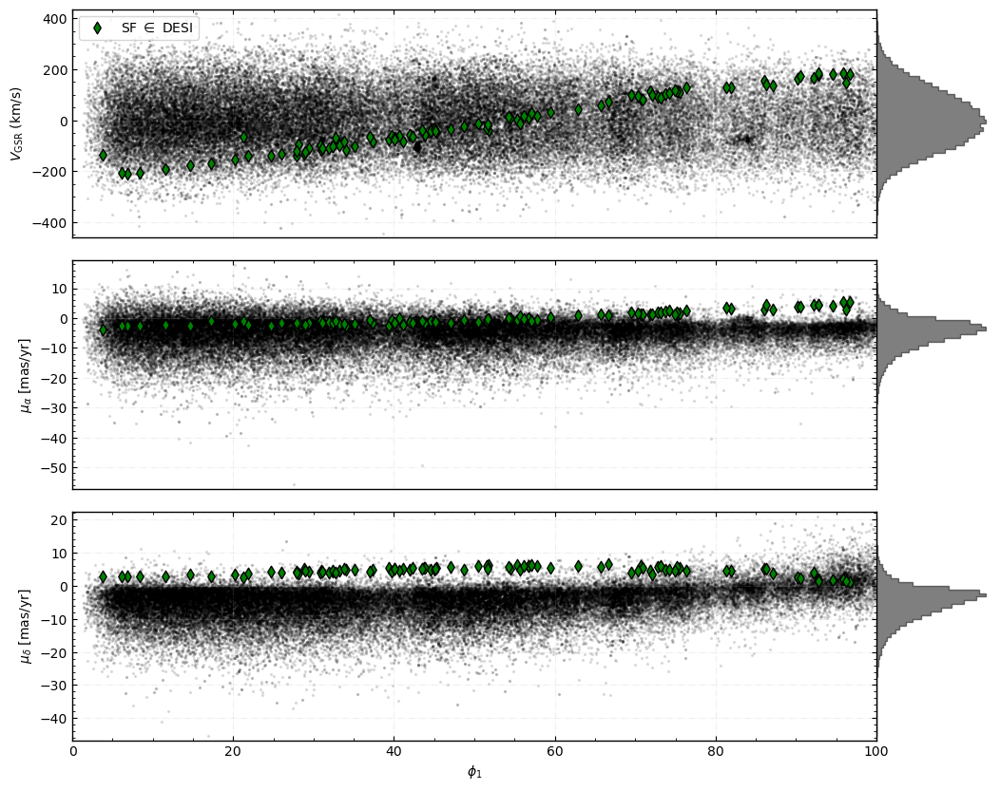

In [161]:
%matplotlib inline

fig, ax = plt_trim.kin_plot(showStream=True, background=True, show_hist=True)

for a in ax:
    a.set_xlim(phi1_min, phi1_max)



In [162]:
# Kinematic cut configuration (edit numbers only)
kinematic_cuts = {
    'spline': {
        'vgsr': {
            'phi1': np.linspace(15, 60, 3), #np.array([-15, 0, 15])
            'vgsr': np.linspace(0, 180, 3),#np.array([-150, 0, 50]),
            'wiggle': 80.0,  # km/s half-width around spline
        },
        'pmra': {
            'phi1': np.array([-4, 4, 5]),
            'pmra': np.array([-4, -5, -6]),
            'wiggle': 2.0,   # mas/yr
        },
        'pmdec': {
            'phi1': np.linspace(-15, 60, 3),
            'pmdec': np.array([-2.5, 0, 1.5]),
            'wiggle': 2.0,   # mas/yr
        },
    },
    'sf': {   # Using STREAMFINDER stars to make a cut
        'pmra_wiggle': 4,  # mas/yr around StreamFinder PMRA trend
        'pmdec_wiggle': 4, # mas/yr around StreamFinder PMDEC trend
    },
    'wide': {
        'vgsr_box': (-250, 250),  # km/s
        'pmra_box': (-7, 10), # mas/yr
        'pmdec_box': (0, 10),
    },
    'galstream': {
        'vgsr': {
            'wiggle':30
        },
        'pmra': {
            'wiggle':10
        },
        'pmdec': {
            'wiggle':30
        },
    },
}


vgsr_wiggle = kinematic_cuts['spline']['vgsr']['wiggle']
pmra_spline_wiggle = kinematic_cuts['spline']['pmra']['wiggle']
pmdec_spline_wiggle = kinematic_cuts['spline']['pmdec']['wiggle']
pmra_sf_wiggle = kinematic_cuts['sf']['pmra_wiggle']
pmdec_sf_wiggle = kinematic_cuts['sf']['pmdec_wiggle']
pmra_min, pmra_max = kinematic_cuts['wide']['pmra_box']
pmdec_min, pmdec_max = kinematic_cuts['wide']['pmdec_box']
vgsr_wide_min, vgsr_wide_max = kinematic_cuts['wide']['vgsr_box']

vgsr_min, vgsr_max = kinematic_cuts['wide']['vgsr_box']

In [180]:
selection_fine.add_mask(
    name='punch3',
    mask_func=lambda df: ~(
        (df['phi1'] > 80) & (df['phi1'] < 85.5) &
        (df['PMDEC'] > 0) & (df['PMDEC'] < 1.75)
    )
)

Mask added: 'punch3'


In [181]:
import importlib
import streamTutorial as st
importlib.reload(st)

_ = st.register_kinematic_masks(selection_fine, kinematic_cuts, SoI.data.SoI_streamfinder, SoI.data.SoI_galstream)

Mask added: 'VGSR_gal'
Mask added: 'PMRA_gal'
Mask added: 'PMDEC_gal'
Mask added: 'VGSR_spline'
Mask added: 'PMRA_SF'
Mask added: 'PMRA_spline'
Mask added: 'PMDEC_SF'
Mask added: 'PMDEC_spline'
Mask added: 'VGSR_wide'
Mask added: 'PMRA_wide'
Mask added: 'PMDEC_wide'


## Lets look at our cuts!

In [182]:
selection_fine.list_masks()

Active masks:
- 3D
- phi2
- phi1
- punch
- feh
- iso
- VGSR_gal
- PMRA_gal
- PMDEC_gal
- VGSR_spline
- PMRA_SF
- PMRA_spline
- PMDEC_SF
- PMDEC_spline
- VGSR_wide
- PMRA_wide
- PMDEC_wide
- punch2
- punch3


#### Figure 9

...'PMDEC_wide' selected 1567191 stars
...'VGSR_wide' selected 9715029 stars
...'PMRA_SF' selected 3815359 stars
...'phi1' selected 6285972 stars
...'phi2' selected 1082117 stars
...'3D' selected 1960961 stars
...'feh' selected 1013623 stars
...'iso' selected 2249393 stars
...'punch' selected 9766327 stars
...'punch2' selected 9768348 stars
...'punch3' selected 9735740 stars
Selection for specified masks: 799 / 9770108 stars.
Created cut_confirmed_sf_and_desi with 7 stars that were filtered out
Number of stars in SF: 297, Number of DESI and SF stars: 88
Saved merged DataFrame as self.data.confirmed_sf_and_desi_b
Stars only in SF3: 209
/Users/nasserm/Documents/vscode/research/streamTut/DESI_streamTutorial/libraries/streamTutorial.py:2086: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  vel_ax.legend(loc='upper left', ncol=4)



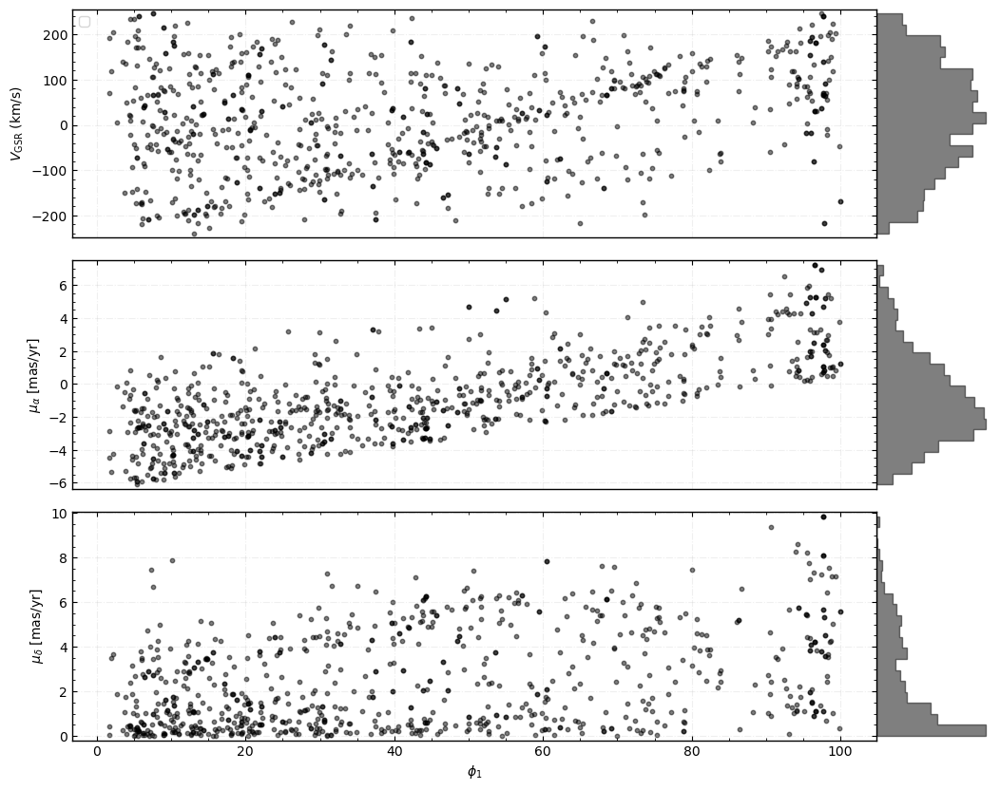

In [184]:
importlib.reload(st)
# Lets take a look at our trimmed DESI data
#---------------------------------#
mask = selection_fine.get_masks(['PMDEC_wide', 'VGSR_wide', 'PMRA_SF', 'phi1', 'phi2', '3D', 'feh', 'iso', 'punch', 'punch2', 'punch3']) # TIP 'PMRA_wide', 'PMDEC_wide' can be used instead if defined
#---------------------------------#


# Using the new method that replaces the 4-line pattern
# VGSR is now automatically computed for confirmed_sf_not_desi within mask_stream()
trimmed_stream = SoI.mask_stream(mask)

plt_trim = st.StreamPlotter(trimmed_stream)
plt_trim.plot_params['sf_in_desi']['alpha']= 0.8
plt_trim.plot_params['sf_not_desi']['alpha']= 0.9
plt_trim.plot_params['background']['alpha']= 0.5
plt_trim.plot_params['background']['s'] = 10
#---------------------------------#
fig, ax = plt_trim.kin_plot(showStream=False, show_sf_only=False, background=True, show_hist=True, hist_kwargs={'bins':20}) # You can change showStream to True to see where the STREAMFINDER stars are in this space.
            # If there aren't many SF stars in DESI, you can show the stars not in DESI as a guide by setting show_sf_only to True
#---------------------------------#
# for a in ax:
#     a.set_xlim(-50, -20)

# ax[0].set_ylim(-150, 150)
# ax[1].set_ylim(-10, 10)

In [185]:
names = ["streamName", "custom_frame", "ra_cut", "dec_cut", "phi2_max", "phi2_min", "phi1_max", 
         "phi1_min",
         "feh_cut", "colour_wiggle", "age", "kinematic_cuts"]
cache_exploreatory = {name: globals()[name] for name in names}

import pickle
from datetime import datetime
current_date = datetime.now().strftime("%y%m%d")
output_dir = f"./runs/{streamName}_{current_date}_{note}"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
with open(output_dir+"/cache_exploreatory.pkl", "wb") as f:
    pickle.dump(cache_exploreatory, f)

In [186]:
print(output_dir+"/cache_exploreatory.pkl")

./runs/M68-P19_260223_testTrue/cache_exploreatory.pkl


**These cuts are quite restrictive** for the sake of spotting a stream by-eye. We'll widen them now to have more stars to run our mixture model on.

In [187]:
import copy
selection_mcmc = copy.copy(selection_fine)

In [188]:
print('Spline VGSR wiggle: ±{} km/s'.format(vgsr_wiggle))
print('Spline PMRA wiggle: ±{} mas/yr'.format(pmra_spline_wiggle))
print('Spline PMDEC wiggle: ±{} mas/yr'.format(pmdec_spline_wiggle))
print('SF PMRA wiggle: ±{} mas/yr'.format(pmra_sf_wiggle))
print('SF PMDEC wiggle: ±{} mas/yr'.format(pmdec_sf_wiggle))
print('Wide VGSR box: {} to {} km/s'.format(vgsr_wide_min, vgsr_wide_max))
print('Wide PMRA box: {} to {} mas/yr'.format(pmra_min, pmra_max))
print('Wide PMDEC box: {} to {} mas/yr'.format(pmdec_min, pmdec_max))


Spline VGSR wiggle: ±80.0 km/s
Spline PMRA wiggle: ±2.0 mas/yr
Spline PMDEC wiggle: ±2.0 mas/yr
SF PMRA wiggle: ±4 mas/yr
SF PMDEC wiggle: ±4 mas/yr
Wide VGSR box: -250 to 250 km/s
Wide PMRA box: -7 to 10 mas/yr
Wide PMDEC box: 0 to 10 mas/yr


In [190]:
## Make your cuts wider than the ones above.

import importlib
import streamTutorial as st
importlib.reload(st)

#---------------------------------#
colour_wiggle = 0.15  # [dex]

# Update wide boxes for mixture model
kinematic_cuts['wide'].update({
    'vgsr_box': (-250, 250),
    'pmra_box': (-10, 10),
    'pmdec_box': (-3, 20),
})

vgsr_wide_min, vgsr_wide_max = kinematic_cuts['wide']['vgsr_box']
pmra_min, pmra_max = kinematic_cuts['wide']['pmra_box']
pmdec_min, pmdec_max = kinematic_cuts['wide']['pmdec_box']

st.register_kinematic_masks(selection_fine, kinematic_cuts, SoI.data.SoI_streamfinder, SoI.data.SoI_galstream)

feh_wide = -1.5 # [dex]
feh_min = -4

selection_fine.add_mask(name='feh_wide',
        mask_func=lambda df: (df['FEH'] < feh_wide))
selection_fine.add_mask(name='feh_min',
        mask_func=lambda df: (df['FEH'] > feh_min))
selection_fine.add_mask(name='iso_wide',
        mask_func=lambda df: (stream_funcs.betw(SoI.data.desi_colour_idx, SoI.isochrone_fit(SoI.data.desi_abs_mag), colour_wiggle) ))
#---------------------------------#


Mask added: 'VGSR_gal'
Mask added: 'PMRA_gal'
Mask added: 'PMDEC_gal'
Mask added: 'VGSR_spline'
Mask added: 'PMRA_SF'
Mask added: 'PMRA_spline'
Mask added: 'PMDEC_SF'
Mask added: 'PMDEC_spline'
Mask added: 'VGSR_wide'
Mask added: 'PMRA_wide'
Mask added: 'PMDEC_wide'
Mask added: 'feh_wide'
Mask added: 'feh_min'
Mask added: 'iso_wide'


In [193]:
mcmc_mask = selection_mcmc.get_masks(['3D', 'phi2', 'phi1', 'VGSR_wide', 'PMRA_wide', 'PMDEC_wide', 'phi1_contig', 'iso_wide', 'feh_wide', 'feh_min', 'punch1', 
                                      'punch2', 'punch3'])

tomcmc_stream = SoI.mask_stream(mcmc_mask)

...'3D' selected 1960961 stars
...'phi2' selected 1082117 stars
...'phi1' selected 6285972 stars
...'VGSR_wide' selected 9715029 stars
...'PMRA_wide' selected 7827731 stars
...'PMDEC_wide' selected 3981986 stars
...'iso_wide' selected 2536601 stars
...'feh_wide' selected 1013623 stars
...'feh_min' selected 9770108 stars
...'punch2' selected 9768348 stars
...'punch3' selected 9735740 stars
Selection for specified masks: 20785 / 9770108 stars.
Created cut_confirmed_sf_and_desi with 7 stars that were filtered out
Number of stars in SF: 297, Number of DESI and SF stars: 88
Saved merged DataFrame as self.data.confirmed_sf_and_desi_b
Stars only in SF3: 209


Below, lets look at our final selection of stars before we run our optimization.

#### Figure 10

Created cut_confirmed_sf_and_desi with 7 stars that were filtered out
Number of stars in SF: 297, Number of DESI and SF stars: 88
Saved merged DataFrame as self.data.confirmed_sf_and_desi_b
Stars only in SF3: 209
Mass Fraction (Z): 5.723722564904767e-05

using ./data/dotter/iso_a13.5_z0.00006.dat
Using distance gradient


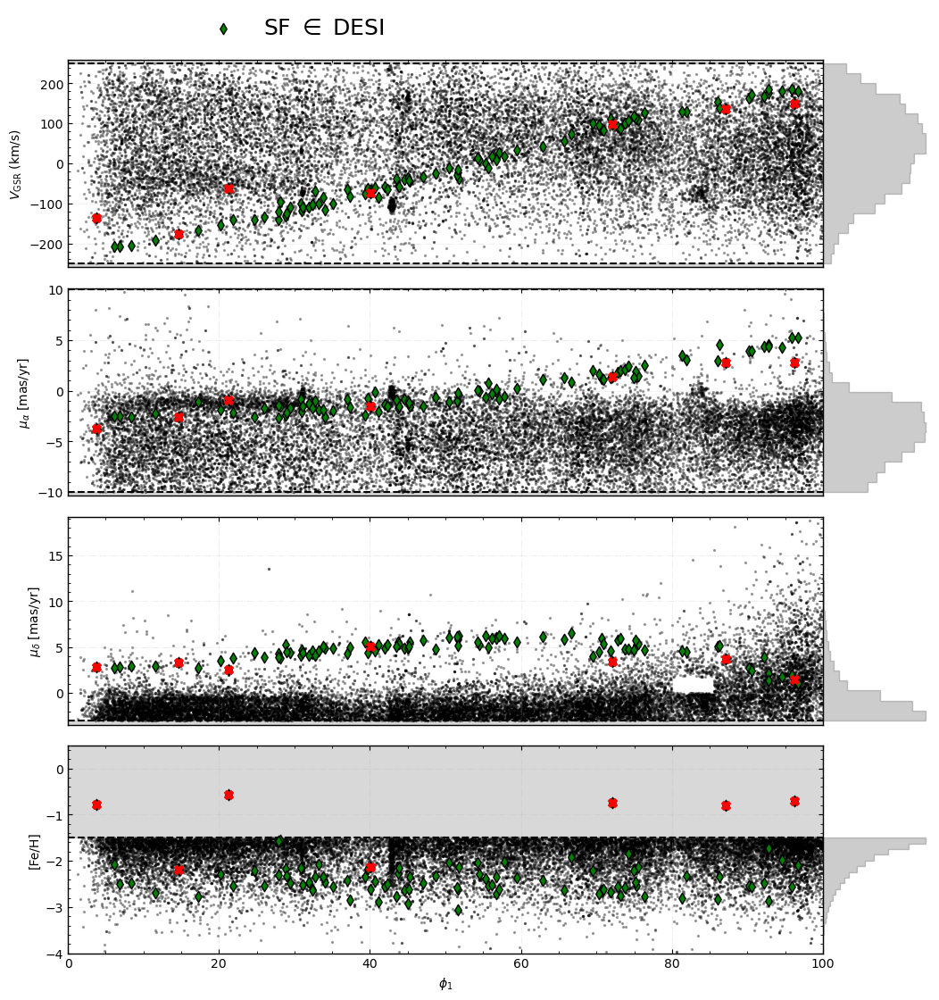

In [194]:
import importlib
import streamTutorial as st
%matplotlib inline

importlib.reload(st)
mask = mcmc_mask

trimmed_stream = SoI.mask_stream(mask)
trimmed_stream.isochrone(metallicity, age=age) 

plt_trim = st.StreamPlotter(trimmed_stream)
plt_trim.plot_params['background']['alpha']=0.3
# plt_trim.plot_params['sf_in_desi']['s'] = 100
plt_trim.plot_params['sf_not_desi']['s'] = 100

# with st.presentation(True):
fig, ax = plt_trim.kin_plot(showStream=True, background=True, show_sf_only=False, show_hist=True, show_feh=True,overlay_galstreams=False, hist_kwargs={"density": True, "color": "k", "histtype": "stepfilled", "alpha": 0.2, "bins":20})
ax[0].legend(loc='upper left', bbox_to_anchor=(0.0, 1.2), fontsize=12, ncol=4, frameon=False)
ax[0].axhline(vgsr_max, color='k', ls='dashed')
ax[0].axhline(vgsr_min, color='k', ls='dashed')
ax[0].axhspan(vgsr_max, ax[0].get_ylim()[1], color='grey', alpha=0.3)
ax[0].axhspan(ax[0].get_ylim()[0], vgsr_min, color='grey', alpha=0.3)


ax[1].axhline(pmra_max, color='k', ls='dashed')
ax[1].axhline(pmra_min, color='k', ls='dashed')
ax[1].axhspan(pmra_max, ax[1].get_ylim()[1], color='grey', alpha=0.3)
ax[1].axhspan(ax[1].get_ylim()[0], pmra_min, color='grey', alpha=0.3)

ax[2].axhline(pmdec_max, color='k', ls='dashed')
ax[2].axhline(pmdec_min, color='k', ls='dashed')
ax[2].axhspan(pmdec_max, ax[2].get_ylim()[1], color='grey', alpha=0.3)
ax[2].axhspan(ax[2].get_ylim()[0], pmdec_min, color='grey', alpha=0.3)

ax[3].axhline(feh_wide, color='k', ls='--')
ax[3].axhspan(feh_wide, ax[3].get_ylim()[1], color='grey', alpha=0.3)

ax[0].scatter(trimmed_stream.data.cut_confirmed_sf_and_desi['phi1'], trimmed_stream.data.cut_confirmed_sf_and_desi['VGSR'], color='red', s=50, marker='X', zorder=5)
ax[1].scatter(trimmed_stream.data.cut_confirmed_sf_and_desi['phi1'], trimmed_stream.data.cut_confirmed_sf_and_desi['PMRA'], color='red', s=50, marker='X', zorder=5)
ax[2].scatter(trimmed_stream.data.cut_confirmed_sf_and_desi['phi1'], trimmed_stream.data.cut_confirmed_sf_and_desi['PMDEC'], color='red', s=50, marker='X', zorder=5)
ax[3].scatter(trimmed_stream.data.cut_confirmed_sf_and_desi['phi1'], trimmed_stream.data.cut_confirmed_sf_and_desi['FEH'], color='red', s=50, marker='X', zorder=5)


ax[0].legend(loc = 'upper left', bbox_to_anchor=(.15, 1.3), fontsize=18, ncol=4, frameon=False)

# for st in tnames:
#     ax[1].plot(mwsts[st].track.pm_ra_cosdec, mwsts[st].track.pm_dec, '-o', ms=2., label=st)

for a in ax:
    a.set_xlim(phi1_min, phi1_max)

In [195]:
SoI.data.desi_data.columns

Index(['TARGET_RA', 'TARGET_DEC', 'FEH', 'FEH_ERR', 'LOGG', 'TARGETID', 'VRAD',
       'PRIMARY', 'TEFF', 'VRAD_ERR', 'PARALLAX_ERROR', 'PMDEC_ERROR',
       'PHOT_BP_MEAN_FLUX', 'PMRA_ERROR', 'PMRA', 'PARALLAX', 'PMDEC',
       'PMRA_PMDEC_CORR', 'SOURCE_ID', 'PHOT_RP_MEAN_FLUX', 'dist_mod',
       'dist_mod_err', 'FLUX_Z', 'FLUX_R', 'FLUX_G', 'EBV', 'dist_mod_right',
       'dist_mod_err_right', 'VGSR', 'phi1', 'phi2'],
      dtype='object')

# Optimizing

If you see a stream above, you may continue with the rest of the notebook!

Before jumping into running MCMC, we will find a good starting point using `scipy.minimize`. This reduces the amount of time we'll need to run the MCMC, and generally means we'll get a better fit.

Streams aren't flat lines in $\phi_1$ dynamically, so we want to allow our fits to vary along the track.

```python
#---------------------------------#
no_of_spline_points = 5
#---------------------------------#
```
Typically we want between 3 and 5 spline points.


In [199]:
importlib.reload(st)
#---------------------------------#
no_of_spline_points = 7
pstream_no_of_spline_points = 1
lsigv_no_spline_points = 1

# Optional: Set custom spline range (if not specified, uses StreamFinder data range)
phi1_min_ = 5# -30 # Set to a specific value to override the leftmost spline location
phi1_max_ = 99# 38 # Set to a specific value to override the rightmost spline location

phi1_spline_array = np.linspace(phi1_min_, phi1_max_, no_of_spline_points) # Automatically set the phi1 spline locations
#OR

# phi1_spline_array = np.array([-29, -22.5, -16]) # Manually set the phi1 spline locations

#---------------------------------#

# Define truncation parameters based on our selection cuts
truncation_params = {
    'vgsr_min': vgsr_wide_min, 'vgsr_max': vgsr_wide_max,
    'feh_min': feh_min, 'feh_max': feh_wide,
    'pmra_min': pmra_min, 'pmra_max': pmra_max,
    'pmdec_min': pmdec_min, 'pmdec_max': pmdec_max
}

MCMeta = st.MCMeta(no_of_spline_points, tomcmc_stream, trimmed_stream.data.confirmed_sf_and_desi, 
                   truncation_params=truncation_params, phi1_min=phi1_min_, phi1_max=phi1_max_,
                       pstream_no_of_spline_points=pstream_no_of_spline_points, lsigv_no_of_spline_points=lsigv_no_spline_points,
                       phi1_spline_points=phi1_spline_array)


MCMeta.initial_params['pstream'] = np.ones(pstream_no_of_spline_points) * (len(MCMeta.stream.data.SoI_streamfinder) / len(MCMeta.stream.data.desi_data))
print(MCMeta.initial_params['pstream'] )
print("phi1 knots:", MCMeta.phi1_spline_points)
print("pstream knots:", MCMeta.pstream_no_of_spline_points)
print("pstream φ₁ grid:", MCMeta.pstream_phi1_spline_points)
print("initial pstream:", MCMeta.initial_params['pstream'])


Making stream initial guess based on galstream and STREAMFINDER...
Stream VGSR dispersion from trimmed SF: 107.87 km/s
Stream mean metallicity from trimmed SF: -2.42 +- 0.271 dex
Stream PMRA dispersion from trimmed SF: 2.14 mas/yr
Stream PMDEC dispersion from trimmed SF: 1.16 mas/yr
Making background initial guess...
Background velocity: 65.01 +- 105.91 km/s
Background metallicity: -1.52 +- 0.400 dex
Background PMRA: -3.48 +- 2.91 mas/yr
Background PMDEC: -2.78 +- 2.45 mas/yr
[0.01428915]
phi1 knots: [ 5.         20.66666667 36.33333333 52.         67.66666667 83.33333333
 99.        ]
pstream knots: 1
pstream φ₁ grid: [5.]
initial pstream: [0.01428915]


In [226]:
MCMeta.initial_params['lsigpmra'] = 0.1
MCMeta.initial_params['lsigpmdec'] = 0.1
MCMeta.initial_params['lsigvgsr'] = 1


Loaded control points from /Users/nasserm/Documents/vscode/research/streamTut/DESI_streamTutorial/libraries/drag_spline_ctrls.npz
Locked φ1 to provided phi1_fixed grid.
Overlayed SF stars: in DESI = 264, not in DESI = 627


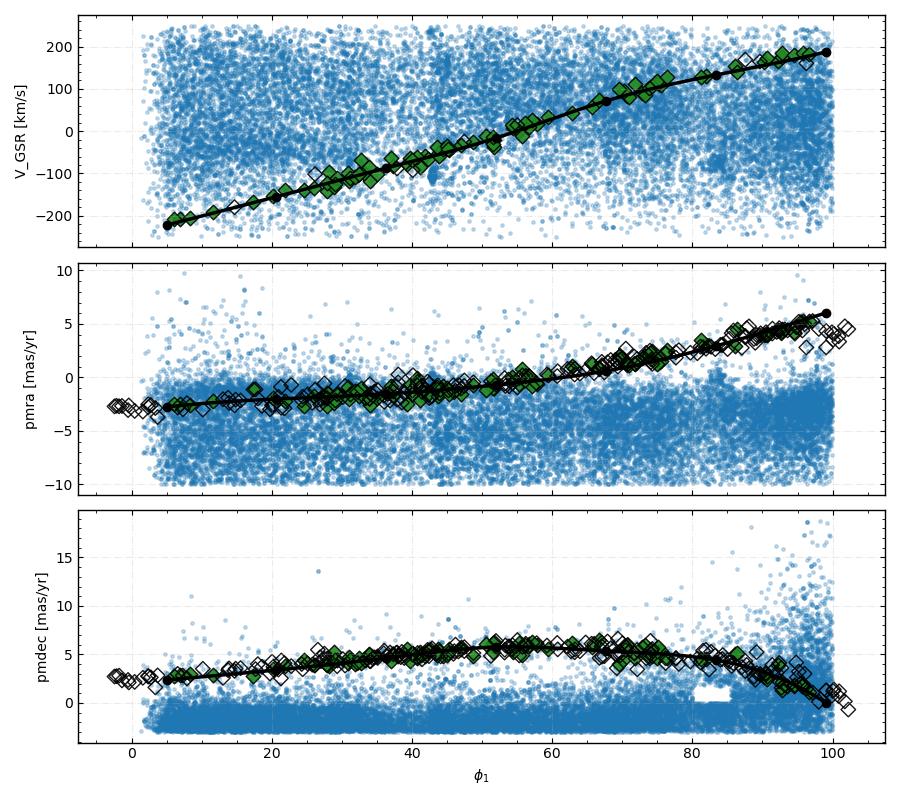

In [227]:
# Interactive drag of spline control points
%matplotlib widget
import importlib, numpy as np
import matplotlib.pyplot as plt
import streamTutorial as st

# Close any existing figures to avoid conflicts
plt.close('all')

importlib.reload(st)

# Use the tomcmc_stream selection for dragging
phi1_for_drag = np.asarray(tomcmc_stream.data.desi_data['phi1'])
vgsr_for_drag = np.asarray(tomcmc_stream.data.desi_data['VGSR'])
pmra_for_drag = np.asarray(tomcmc_stream.data.desi_data['PMRA'])
pmdec_for_drag = np.asarray(tomcmc_stream.data.desi_data['PMDEC'])

# Optional overlays: StreamFinder stars in DESI and not in DESI
sf_in = None
sf_not = None

if hasattr(trimmed_stream.data, 'confirmed_sf_and_desi') and len(trimmed_stream.data.confirmed_sf_and_desi) > 0:
    sf_df = trimmed_stream.data.confirmed_sf_and_desi
    sf_in = {
        'phi1': np.asarray(sf_df['phi1']) if 'phi1' in sf_df else np.asarray(sf_df['PHI1']),
        'vgsr': np.asarray(sf_df['VGSR']),
        'pmra': np.asarray(sf_df['PMRA']),
        'pmdec': np.asarray(sf_df['PMDEC']),
    }

if hasattr(trimmed_stream.data, 'confirmed_sf_not_desi') and len(trimmed_stream.data.confirmed_sf_not_desi) > 0:
    sf_df = trimmed_stream.data.confirmed_sf_not_desi
    def pick(colnames):
        for c in colnames:
            if c in sf_df:
                return np.asarray(sf_df[c])
        return None
    phi1_sf = pick(['phi1', 'PHI1'])
    vgsr_sf = pick(['VGSR', 'VHel'])
    pmra_sf = pick(['PMRA', 'pmRA'])
    pmdec_sf = pick(['PMDEC', 'pmDE'])
    if phi1_sf is not None and vgsr_sf is not None and pmra_sf is not None and pmdec_sf is not None:
        sf_not = {
            'phi1': phi1_sf,
            'vgsr': vgsr_sf,
            'pmra': pmra_sf,
            'pmdec': pmdec_sf,
        }

drag_state = st.drag_spline(
    phi1_for_drag,
    vgsr_for_drag,
    pmra_for_drag,
    pmdec_for_drag,
    sf_in_desi=sf_in,
    sf_not_desi=sf_not,
    n_ctrl=no_of_spline_points,
    phi1_fixed=MCMeta.phi1_spline_points,
    showGalstream=False,
    galstream_obj = SoI.data.SoI_galstream
)

In [228]:
# Save dragged control points and sync MCMeta defaults
ctrls = drag_state["save"]()

phi1_spline_array = np.asarray(ctrls['vgsr']['x'], dtype=float)
order = np.argsort(phi1_spline_array)
phi1_spline_array = phi1_spline_array[order]

vgsr_pts = np.asarray(ctrls['vgsr']['y'], dtype=float)[order]
pmra_pts = np.asarray(ctrls['pmra']['y'], dtype=float)[order]
pmdec_pts = np.asarray(ctrls['pmdec']['y'], dtype=float)[order]

no_of_spline_points = len(phi1_spline_array)

MCMeta.phi1_spline_points = phi1_spline_array
MCMeta.no_of_spline_points = no_of_spline_points
MCMeta.initial_params['phi1_spline_points'] = phi1_spline_array
MCMeta.initial_params['vgsr_spline_points'] = vgsr_pts
MCMeta.initial_params['pmra_spline_points'] = pmra_pts
MCMeta.initial_params['pmdec_spline_points'] = pmdec_pts
MCMeta.initial_params['lsigvgsr'] = MCMeta.initial_params.get('lsigvgsr', 1)

print('phi1_spline_array:', phi1_spline_array)
print('vgsr_spline_points:', vgsr_pts)
print('pmra_spline_points:', pmra_pts)
print('pmdec_spline_points:', pmdec_pts)


Saved control points to /Users/nasserm/Documents/vscode/research/streamTut/DESI_streamTutorial/libraries/drag_spline_ctrls.npz
phi1_spline_array: [ 5.         20.66666667 36.33333333 52.         67.66666667 83.33333333
 99.        ]
vgsr_spline_points: [-221.96232572 -154.78593366  -87.09163215  -16.10705658   71.44058662
  132.96055211  187.38206004]
pmra_spline_points: [-2.76471086 -2.01694318 -1.54958839 -0.70834975  0.60024368  2.93701767
  6.02155933]
pmdec_spline_points: [2.36449725 3.39567212 4.63308195 5.7673743  5.35490436 4.42684698
 0.02646057]


In [229]:
initial_params = MCMeta.initial_params

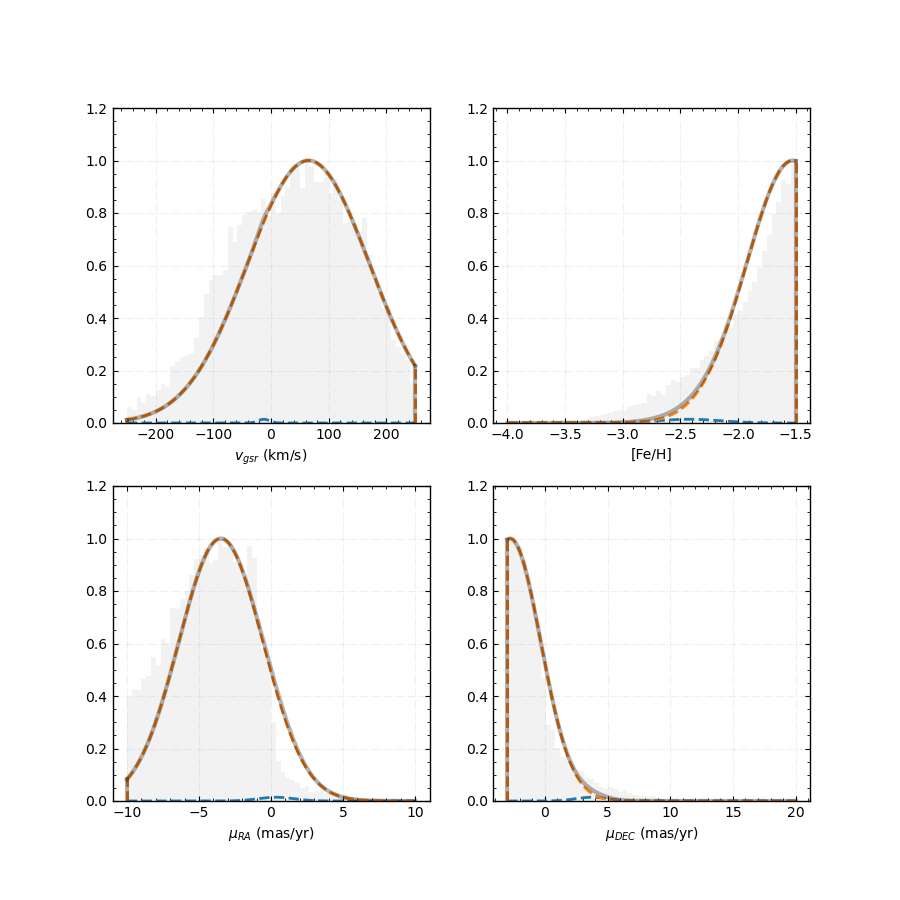

In [230]:
importlib.reload(st)
plt_test = st.StreamPlotter(MCMeta)
fig, axes = plt_test.show_gaussians()

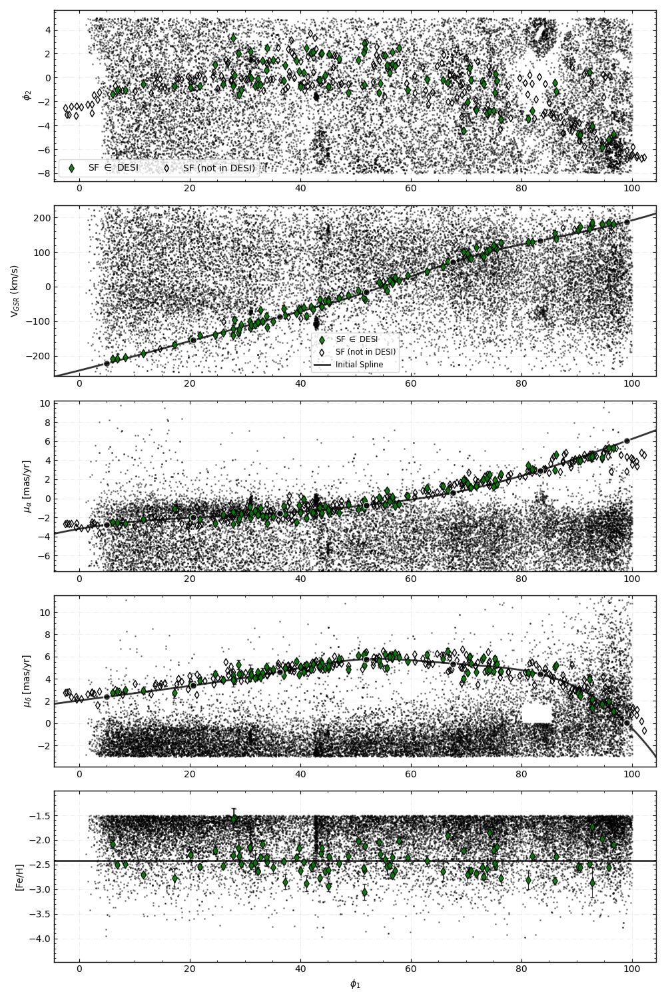

In [231]:
importlib.reload(st)

plt_enhanced = st.StreamPlotter(MCMeta) 
plt_enhanced.plot_params['sf_in_desi']['alpha'] = 0.9
plt_enhanced.plot_params['background']['alpha'] = 0.4
plt_enhanced.plot_params['background']['s'] = 1

fig, ax = plt_enhanced.sixD_plot(
    showStream=True, 
    show_sf_only=True, 
    background=True,
    show_initial_splines=True,
    show_optimized_splines=False,
    show_sf_errors=True  # Now enable error bars
)

plt.tight_layout()
plt.show()

We're doing a mixture model, but what are we mixing? Lets take a look at our intial guesses below:

#### Figure 11

You can see our initial guess above. showing the mixture of the stream model (blue) and the background model (orange) combining to make the overall distribution (black). Depending on your cuts, you may also notice that the gaussians are truncated for some parameters—this is done to allow us to cut down on the background stars while still modelling each population with some gaussian mean and spread.

## Priors

An important step for our analysis is to provide strong priors about the background and stream. We will base those around our initial guess, using the STREAMFINDER catalogue to inform our priors.

In [232]:
importlib.reload(st)
vgsr_range_wiggle = 80
pmra_range_wiggle = 5
pmdec_range_wiggle = 5
lsigvgsr_r = [(-2, 2)]

vgsr_ranges = [(v - vgsr_range_wiggle, v + vgsr_range_wiggle) for v in MCMeta.initial_params['vgsr_spline_points']]
pmra_ranges = [(v - pmra_range_wiggle, v + pmra_range_wiggle) for v in MCMeta.initial_params['pmra_spline_points']]
pmdec_ranges = [(v - pmdec_range_wiggle, v + pmdec_range_wiggle) for v in MCMeta.initial_params['pmdec_spline_points']]

# NOTE use below if you want flat priors instead of moving priors
# vgsr_range_upper, vgsr_range_lower = vgsr_wide_max, vgsr_wide_min
# pmra_range_upper, pmra_range_lower = pmra_max, pmra_min
# pmdec_range_upper, pmdec_range_lower = pmdec_max, pmdec_min

# vgsr_ranges = [(vgsr_range_lower, vgsr_range_upper) for v in MCMeta.initial_params['vgsr_spline_points']]
# pmra_ranges = [(pmra_range_lower, pmra_range_upper) for v in MCMeta.initial_params['pmra_spline_points']]
# pmdec_ranges = [(pmdec_range_lower, pmdec_range_upper) for v in MCMeta.initial_params['pmdec_spline_points']]

# Flexible pstream range based on number of spline points
pstream_r = [(0, 1) for _ in range(pstream_no_of_spline_points)]

#---------------------------------#
feh1_r = (-3.5,-0.75)
#---------------------------------#
lsigfeh_r = (-2,1)
lsigpmra_r = (-5, 0.1)
lsigpmdec_r = (-5, 0.1)

bv_r = (-200, 200)
lsigbv_r = (-2,2.5)
bfeh_r = (-3, 1)
lsigbfeh_r = (-2,1)
bpmra_r = (-25, 5)
lsigbpmra_r = (-2, 1.5)
bpmdec_r = (-25, 5)
lsigbpmdec_r = (-2,1.5)

# Include lsigpm bounds only if present in MCMeta.param_labels (i.e., not fixed)
include_lsigpm = ('lsigpmra' in MCMeta.param_labels) or ('lsigpmdec' in MCMeta.param_labels)
prior = [
    *pstream_r,              # pstream (flexible based on pstream_no_of_spline_points)
    *vgsr_ranges,           # vgsr_spline_points (flexible based on no_of_spline_points)
    *lsigvgsr_r,             # lsigvgsr (flexible: single or multiple values)
    feh1_r, lsigfeh_r,      # feh parameters
    *pmra_ranges,           # pmra_spline_points (flexible based on no_of_spline_points)  
    *( [lsigpmra_r] if include_lsigpm else [] ),   # lsigpmra (optional)
    *pmdec_ranges,          # pmdec_spline_points (flexible based on no_of_spline_points)
    *( [lsigpmdec_r] if include_lsigpm else [] ),  # lsigpmdec (optional)
    bv_r, lsigbv_r, bfeh_r, lsigbfeh_r,  # background parameters
    bpmra_r, lsigbpmra_r, bpmdec_r, lsigbpmdec_r
]

MCMeta.priors(prior)

expanded_param_labels=st._build_expanded_param_labels(MCMeta)

[MCMeta] Using user-provided nwalkers = 70 (2 * ndim = 70)


In [233]:
for i, val in enumerate(MCMeta.flat_p0_guess):
    pmin, pmax = prior[i]
    if not (pmin <= val <= pmax):
        print(f'Warning: Initial guess for parameter {i} ({val}) is outside the prior range for {expanded_param_labels[i]}')

# MCMeta.initial_params['lsigvgsr'] = 1
MCMeta.priors(prior) # reloads initial guess if manually set above

[MCMeta] Using user-provided nwalkers = 70 (2 * ndim = 70)


Now that we have our priors set, lets try running a basic minimization to find a good starting point for the MCMC. This will run from 10 to 60 seconds...

some options:
- Nelder-Mead
- COBYLA

In [243]:
MCMeta.scipy_optimize(method='Nelder-Mead')

Running optimization...
Optimization terminated successfully.

Optimized Parameters:
pstream: 0.0143
vgsr_spline_points: [-221.96232572 -154.78593366  -87.09163215  -16.10705658   71.44058662
  132.96055211  187.38206004]
sigvgsr: 10.0000
feh1: -2.4227
sigfeh: 0.2711
pmra_spline_points: [-2.76471086 -2.01694318 -1.54958839 -0.70834975  0.60024368  2.93701767
  6.02155933]
sigpmra: 1.2589
pmdec_spline_points: [2.36449725 3.39567212 4.63308195 5.7673743  5.35490436 4.42684698
 0.02646057]
sigpmdec: 1.2589
bv: 65.0148
sigbv: 109.8222
bfeh: -1.5891
sigbfeh: 0.3998
bpmra: -3.4845
sigbpmra: 2.9144
bpmdec: -2.7821
sigbpmdec: 2.4462


In [244]:
theta0 = MCMeta.flat_p0_guess
eps = np.zeros_like(theta0)
eps[0] = 1e-3   # perturb first parameter

print("f(theta0) =", MCMeta.optfunc(theta0))
print("f(theta0 + eps) =", MCMeta.optfunc(theta0 + eps))

f(theta0) = 230737.0932734335
f(theta0 + eps) = 230744.37435997988


In [245]:
res = MCMeta.sp_result
print("success:", res.success)
print("status:", res.status)
print("message:", res.message)
print("fun:", res.fun)
print("nfev:", res.nfev)
print("nit:", getattr(res, "nit", None))

theta0 = MCMeta.flat_p0_guess.copy()
print("f(theta0):", MCMeta.optfunc(theta0))

eps = 1e-4
for i in [0, 1, 2, 5, 10]:
    t = theta0.copy()
    t[i] += eps
    print(i, MCMeta.optfunc(t))


success: True
status: 0
message: Optimization terminated successfully.
fun: 229720.10308559332
nfev: 1849
nit: 50
f(theta0): 230737.0932734335
0 230737.7811930452
1 230737.09322306706
2 230737.09337506248
5 230737.0932026504
10 230737.09436835613


In [246]:
for i, p in enumerate(MCMeta.sp_result.x):
    print(f'{i}, {expanded_param_labels[i]}: \t \t {p}')

0, pstream: 	 	 0.014289150829925427
1, vgsr1: 	 	 -221.9623257195633
2, vgsr2: 	 	 -154.78593366416862
3, vgsr3: 	 	 -87.09163214596947
4, vgsr4: 	 	 -16.107056580920016
5, vgsr5: 	 	 71.44058661597433
6, vgsr6: 	 	 132.96055210568375
7, vgsr7: 	 	 187.3820600388883
8, lsigvgsr: 	 	 1.0
9, feh1: 	 	 -2.422653513855342
10, lsigfeh: 	 	 -0.5668641593100056
11, pmra1: 	 	 -2.7647108593110943
12, pmra2: 	 	 -2.016943183645722
13, pmra3: 	 	 -1.5495883863548627
14, pmra4: 	 	 -0.7083497512313102
15, pmra5: 	 	 0.6002436811830947
16, pmra6: 	 	 2.9370176676373987
17, pmra7: 	 	 6.021559329757075
18, lsigpmra: 	 	 0.1
19, pmdec1: 	 	 2.36449725368427
20, pmdec2: 	 	 3.39567211692958
21, pmdec3: 	 	 4.633081952823954
22, pmdec4: 	 	 5.767374302393796
23, pmdec5: 	 	 5.35490435709567
24, pmdec6: 	 	 4.426846980174892
25, pmdec7: 	 	 0.02646057016464809
26, lsigpmdec: 	 	 0.1
27, bv: 	 	 65.01478960030099
28, lsigbv: 	 	 2.040690187437468
29, bfeh: 	 	 -1.589128001781496
30, lsigbfeh: 	 	 -0.39

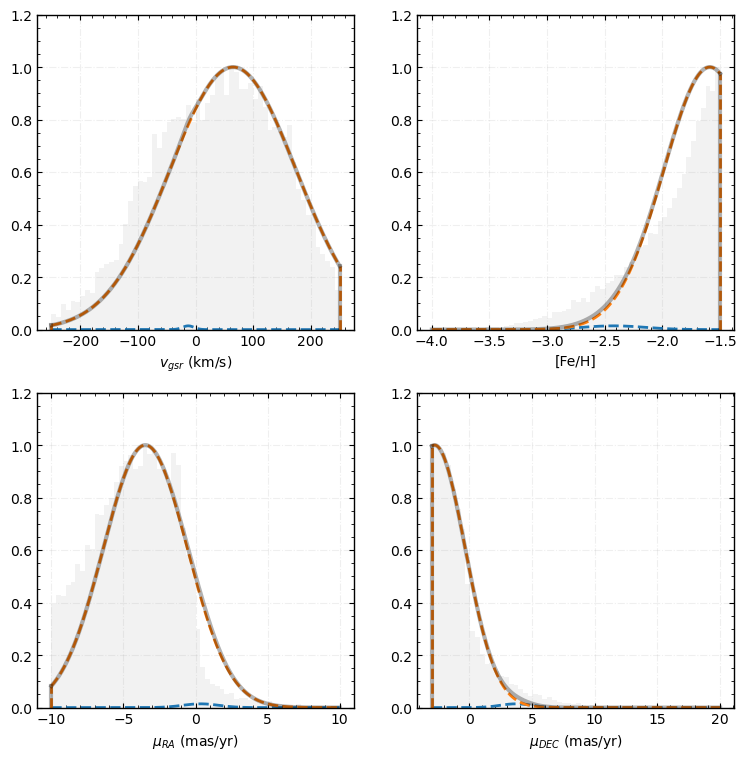

In [247]:
importlib.reload(st)
%matplotlib inline
plt_test = st.StreamPlotter(MCMeta)
fig, axes = plt_test.show_gaussians(param_source=MCMeta.sp_output)

#### Figure 13

The above cell automatically checks if your prior was any good. If you get a message like the following:

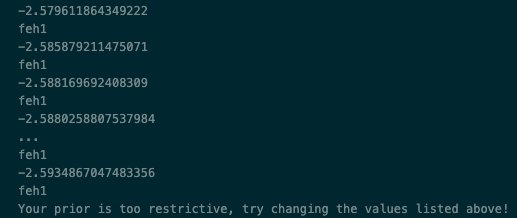

Try going back and adjusting the mentioned parameter.

#### Figure 14

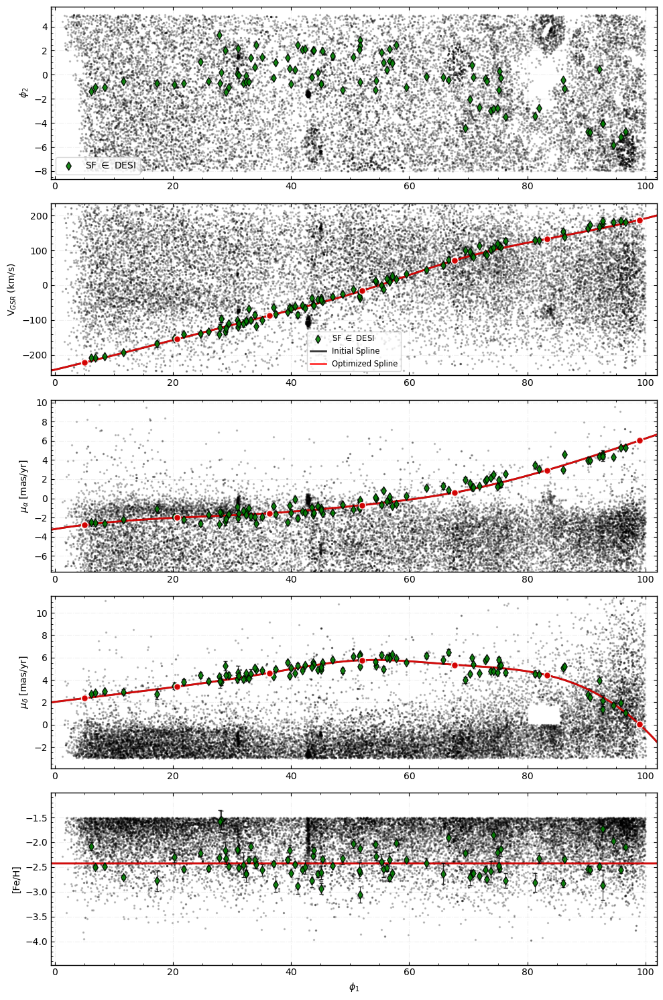

In [248]:
importlib.reload(st)

plt_enhanced = st.StreamPlotter(MCMeta) 
plt_enhanced.plot_params['sf_in_desi']['alpha'] = 0.9
plt_enhanced.plot_params['background']['alpha'] = 0.2
plt_enhanced.plot_params['background']['s'] = 2

fig, ax = plt_enhanced.sixD_plot(
    showStream=True, 
    show_sf_only=False, 
    background=True,
    show_initial_splines=True,
    show_optimized_splines=True,
    show_sf_errors=True  # Now enable error bars
)

plt.tight_layout()
plt.show()

In [249]:
MCMeta.optimized_params.keys()

odict_keys(['pstream', 'vgsr_spline_points', 'lsigvgsr', 'feh1', 'lsigfeh', 'pmra_spline_points', 'lsigpmra', 'pmdec_spline_points', 'lsigpmdec', 'bv', 'lsigbv', 'bfeh', 'lsigbfeh', 'bpmra', 'lsigbpmra', 'bpmdec', 'lsigbpmdec'])

In [250]:
names = ["feh_wide", "feh_min",
         "no_of_spline_points","pstream_no_of_spline_points", "lsigv_no_spline_points", "phi1_min_", "phi1_max_",
         "truncation_params", "initial_params", "prior"]
cached_optimized = {name: globals()[name] for name in names}



with open(output_dir+"/cache_optimized.pkl", "wb") as f:
    pickle.dump(cached_optimized, f)

# # later
# with open("cached.pkl", "rb") as f:
#     cached = pickle.load(f)

# EMCEE

Once we've optimized our intial guess with Scipy, we can run our MCMC sampler.

Only run this is you are interested in the MCMC sampler. This will take up to 20 minutes unless you reduce the number of burnin's or steps taken.

In [251]:
importlib.reload(st)
from datetime import datetime
import os
current_date = datetime.now().strftime("%y%m%d")
output_dir = f"./runs/{streamName}_{current_date}_{note}"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

mcmc = st.MCMC(MCMeta, output_dir)

In [252]:
%%time
#---------------------------------#
nproc = 32
nsteps = 10000
use_optimized_start = True  # True: start from optimized; False: start from initial guess
#---------------------------------#

mcmc.run(
    nproc=nproc,
    nsteps=nsteps,
    use_optimized_start=use_optimized_start
)

Using optimized parameters as starting positions...
Clipping all walker positions to be within prior ranges...
Running a single continuous chain for 10000 iterations starting from optimized parameters...


MCMC Progress:   0%|          | 0/10000 [00:00<?, ?step/s]

Took 1559.5 seconds (26.0 minutes)
Computing flatchain (no burn-in discarded; use apply_burnin to change)...
CPU times: user 6min 49s, sys: 5min 38s, total: 12min 27s
Wall time: 26min


#### Figure 15

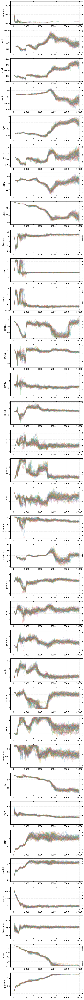

In [253]:
mcmc.show_chains(trimmed=False)

#### Select burn-in (post-hoc)

Choose how many initial steps to discard (burn-in).

In [137]:
#---------------------------------#
discard = 6000#+18000   # e.g., discard first 3000 steps
thin = 1      # optional thinning
#---------------------------------#

mcmc.apply_burnin(discard=discard, thin=thin)

Applied burn-in: discard=6000, thin=1. Flatchain shape: (420000, 26)


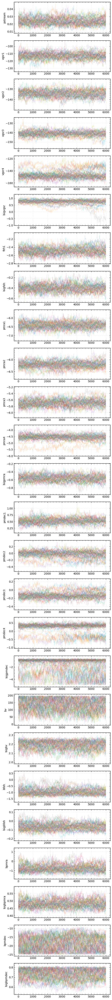

In [138]:
mcmc.show_chains(trimmed=True)

#### Figure 16

In [139]:
# mcmc.show_corner()

In [140]:
mcmc.print_result()

26
OrderedDict([('pstream', 0.0233351375264407), ('vgsr1', -112.90137952251638), ('vgsr2', -134.3670513573278), ('vgsr3', -140.9683904098478), ('vgsr4', -148.24327952475917), ('lsigvgsr', 0.7654279795629952), ('feh1', -2.4939702766486107), ('lsigfeh', -0.40481216474107284), ('pmra1', -6.416941184435743), ('pmra2', -6.207015258400594), ('pmra3', -5.6997968915226185), ('pmra4', -4.534611153249086), ('lsigpmra', -0.5629104441692911), ('pmdec1', 0.5313932626439731), ('pmdec2', -0.008230808688706535), ('pmdec3', -0.14087645262393034), ('pmdec4', 0.31957930989470223), ('lsigpmdec', -0.9868157212284115), ('bv', 141.6362760976951), ('lsigbv', 2.2022937747132065), ('bfeh', -0.9904586886886868), ('lsigbfeh', -0.06865541198176889), ('bpmra', -0.7935699919678812), ('lsigbpmra', 0.4782161217476878), ('bpmdec', -18.506251129494558), ('lsigbpmdec', 0.734251489140745)])
param             med         em         ep   exp(med)    exp(em)    exp(ep)
--------------------------------------------------------

#### Figure 17


Plotting MCMC-based Gaussian mixture...
-1.5
-0.9904586886886868


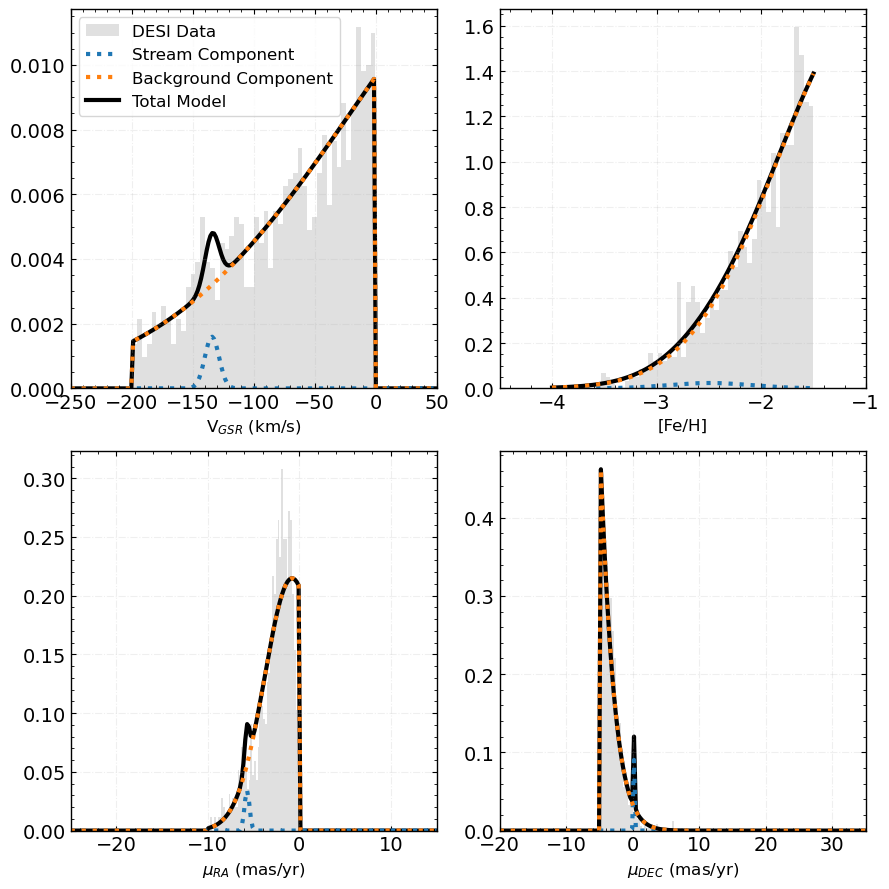

In [141]:
importlib.reload(st)

# Use MCMC results for plotting
meds = mcmc.meds # Store MCMC results in MCMeta
original_params = MCMeta.initial_params.copy()

# Convert MCMC results to the format expected by the plotting function
mcmc_for_plotting = {}

# Compact callable (no def) to collect spline-point values
_collect_spline_points = lambda p: (lambda ks: np.array([meds[k] for k in ks]) if ks else np.array([meds[f"{p}{i}"] for i in range(1, no_of_spline_points+1)]))(
	sorted([k for k in meds if k.startswith(p) and k[len(p):].isdigit()], key=lambda k: int(k[len(p):]))
)

vgsr_points = _collect_spline_points('vgsr')
pmra_points = _collect_spline_points('pmra')
pmdec_points = _collect_spline_points('pmdec')

mcmc_for_plotting = {
    'pstream': meds['pstream'],
	'vgsr_spline_points': vgsr_points,
	'lsigvgsr': meds['lsigvgsr'], 
	'feh1': meds['feh1'],
	'lsigfeh': meds['lsigfeh'],
	'pmra_spline_points': pmra_points,
	'lsigpmra': (meds['lsigpmra'] if 'lsigpmra' in meds else MCMeta.lsigpm_),
	'pmdec_spline_points': pmdec_points,
	'lsigpmdec': (meds['lsigpmdec'] if 'lsigpmdec' in meds else MCMeta.lsigpm_),
	'bv': meds['bv'],
	'lsigbv': meds['lsigbv'],
	'bfeh': meds['bfeh'],
	'lsigbfeh': meds['lsigbfeh'],
	'bpmra': meds['bpmra'],
	'lsigbpmra': meds['lsigbpmra'],
	'bpmdec': meds['bpmdec'],
	'lsigbpmdec': meds['lsigbpmdec']
}

# Update MCMeta with MCMC results
MCMeta.initial_params = mcmc_for_plotting

print("\nPlotting MCMC-based Gaussian mixture...")
plt_mcmc = st.StreamPlotter(MCMeta)
plt_mcmc.gaussian_mixture_plot(showStream=False, background=True, show_model=True, show_total=True)

# Restore original initial_params
MCMeta.initial_params = original_params

#plt.suptitle('MCMC-based Gaussian Mixture Model', fontsize=14, y=0.98)
plt.tight_layout()
plt.show()

(<Figure size 900x900 with 4 Axes>,
 array([[<Axes: xlabel='$v_{gsr}$ (km/s)'>, <Axes: xlabel='[Fe/H]'>],
        [<Axes: xlabel='$\\mu_{RA}$ (mas/yr)'>,
         <Axes: xlabel='$\\mu_{DEC}$ (mas/yr)'>]], dtype=object))

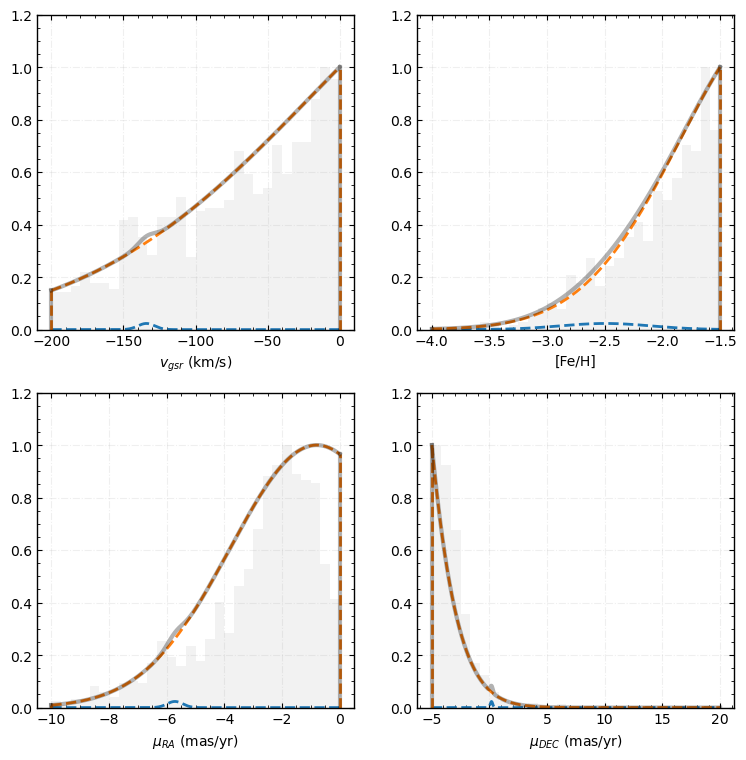

In [142]:
importlib.reload(st)
plt_mcmc = st.StreamPlotter(MCMeta)
meds = mcmc.meds
mcmc_for_plotting = {
    'pstream': meds['pstream'],
	'vgsr_spline_points': vgsr_points,
	'lsigvgsr': meds['lsigvgsr'], 
	'feh1': meds['feh1'],
	'lsigfeh': meds['lsigfeh'],
	'pmra_spline_points': pmra_points,
	'lsigpmra': (meds['lsigpmra'] if 'lsigpmra' in meds else MCMeta.lsigpm_),
	'pmdec_spline_points': pmdec_points,
	'lsigpmdec': (meds['lsigpmdec'] if 'lsigpmdec' in meds else MCMeta.lsigpm_),
	'bv': meds['bv'],
	'lsigbv': meds['lsigbv'],
	'bfeh': meds['bfeh'],
	'lsigbfeh': meds['lsigbfeh'],
	'bpmra': meds['bpmra'],
	'lsigbpmra': meds['lsigbpmra'],
	'bpmdec': meds['bpmdec'],
	'lsigbpmdec': meds['lsigbpmdec']
}

plt_mcmc.show_gaussians(param_source=mcmc_for_plotting, numBins=30)

# Membership Probability

We now have our final gaussian mixture model parameters! We can go ahead and then calculate the probability that each star belongs to the 'stream' population.

We will sample from the posterior 1000 times and take the median value of each star's membership probability.

#### Figure 18

In [143]:
len(mcmc.stream.data.desi_data)

1279

sampling the posterior with 1000 
Calculated membership probabilities for 1279 stars
Membership probabilities range from 0.000 to 1.000
Mean membership probability: 0.024
Stars with >50% probability: 31
Stars with >70% probability: 31
Stars with >90% probability: 31


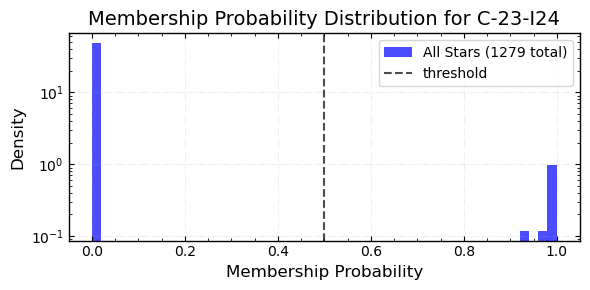


Membership statistics:
Threshold | Count
----------|-------
   ≥0.3   |    31 
   ≥0.5   |    31 
   ≥0.9   |    31 


In [150]:
# Calculate membership probabilities using mcmc.memprob function
post_df = mcmc.memprob(N_samples=1000)
stream_prob, stream_prob_em, stream_prob_ep = post_df['stream_prob'], post_df['stream_prob_em'], post_df['stream_prob_ep']


# Create membership probability histogram
fig, ax = plt.subplots(1, 1, figsize=(6, 3))

#---------------------------------#
min_prob = 0.5 # Change this to adjust the stream probability threshold
#---------------------------------#

ax.hist(stream_prob, bins=50, alpha=0.7, color='blue', 
        label=f'All Stars ({len(stream_prob)} total)', density=True)

ax.axvline(min_prob, color='black', linestyle='--', alpha=0.7, label='threshold')

# Format plot
ax.set_xlabel('Membership Probability', fontsize=12)
ax.set_ylabel('Density', fontsize=12)
ax.set_title(f'Membership Probability Distribution for {streamName}', fontsize=14)
ax.legend()
ax.grid(alpha=0.3)
stream_funcs.plot_form(ax)

# log yaxis
ax.set_yscale('log')

plt.tight_layout()
plt.show()

# Print statistics for different probability thresholds
thresholds = [0.3, 0.5, 0.9]
print("\nMembership statistics:")
print("Threshold | Count")
print("----------|-------")
for thresh in thresholds:
    count = len(stream_prob[stream_prob >= thresh])
    print(f"   ≥{thresh:3.1f}   | {count:5d} ")

In [151]:
stream_colour_index, _, stream_r_mag = stream_funcs.get_colour_index_and_abs_mag(
                    post_df['EBV'], post_df['FLUX_G'], post_df['FLUX_R'], None
                )

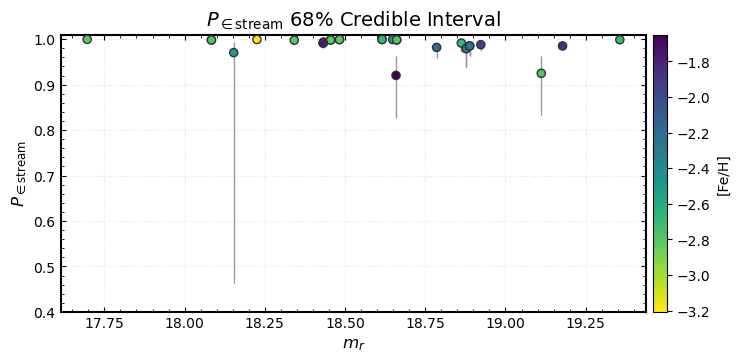

In [152]:
high_prob = stream_prob_em > min_prob-0.2

x = stream_r_mag[high_prob]
y = stream_prob[high_prob]

xerr = np.vstack([
    stream_prob[high_prob] - stream_prob_em[high_prob],
    stream_prob_ep[high_prob] - stream_prob[high_prob],
])

fig, ax = plt.subplots(1, 1, figsize=(6*1.5, 2*1.8))

ax.errorbar(
    x, y,
    yerr=xerr,
    xerr=None,
    fmt='none',
    ecolor='0.6',
    elinewidth=1,
    capsize=0,
)

sc = ax.scatter(
    x, y,
    c=post_df['FEH'][high_prob],
    cmap='viridis_r',
    s=35,
    edgecolors='0.2',
    linewidths=1,zorder=5
)

# plt.colorbar(sc, ax=ax, pad=0.01)

ax.set_xlabel(r'$m_r$', fontsize=12)
ax.set_ylabel(r'$P_{\in \text{stream}}$', fontsize=12)
ax.set_title(r'$P_{\in \text{stream}}$ 68% Credible Interval', fontsize=14)
ax.set_ylim(min_prob-0.1, 1.01)
#label cbar as g-r, put cbar horizontal on top, fontsize 12
ax.figure.colorbar(sc, ax=ax, label='[Fe/H]', pad=0.01)
stream_funcs.plot_form(ax)
for spine in ax.spines.values():
    spine.set_linewidth(1.5)

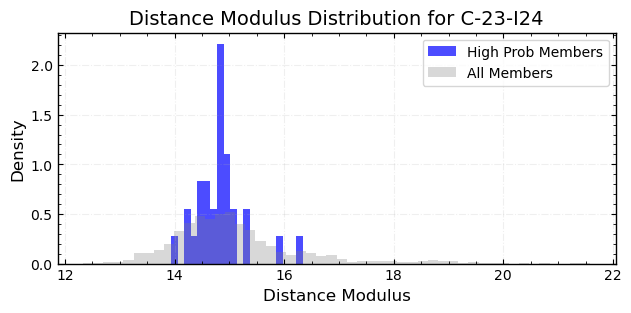

In [153]:
#make histogram of distance modulus of high prob members and all members
fig, ax = plt.subplots(1, 1, figsize=(6*1.2, 2*1.5))
ax.hist(post_df['dist_mod'][high_prob], bins=20, alpha=0.7, color='blue', label='High Prob Members', density=True)
ax.hist(post_df['dist_mod'], bins=50, alpha=0.3, color='grey', label='All Members', density=True)
ax.set_xlabel('Distance Modulus', fontsize=12)
ax.set_ylabel('Density', fontsize=12)
ax.set_title(f'Distance Modulus Distribution for {streamName}', fontsize=14)
ax.legend()
ax.grid(alpha=0.3)
stream_funcs.plot_form(ax)

In [154]:
# importlib.reload(st.set_presentation)
st.set_presentation(False)

Now lets take a look at the stream you found!

/Users/nasserm/Documents/vscode/research/streamTut/DESI_streamTutorial/libraries/streamTutorial.py:2633: FutureWarning: Using a boolean indexer with length 0 on an Index with length greater than 0 is deprecated and will raise in a future version.
  sf_indices_high = sf_in_desi_indices[sf_high_prob_mask]

/Users/nasserm/Documents/vscode/research/streamTut/DESI_streamTutorial/libraries/streamTutorial.py:2634: FutureWarning: Using a boolean indexer with length 0 on an Index with length greater than 0 is deprecated and will raise in a future version.
  sf_indices_low = sf_in_desi_indices[~sf_high_prob_mask]



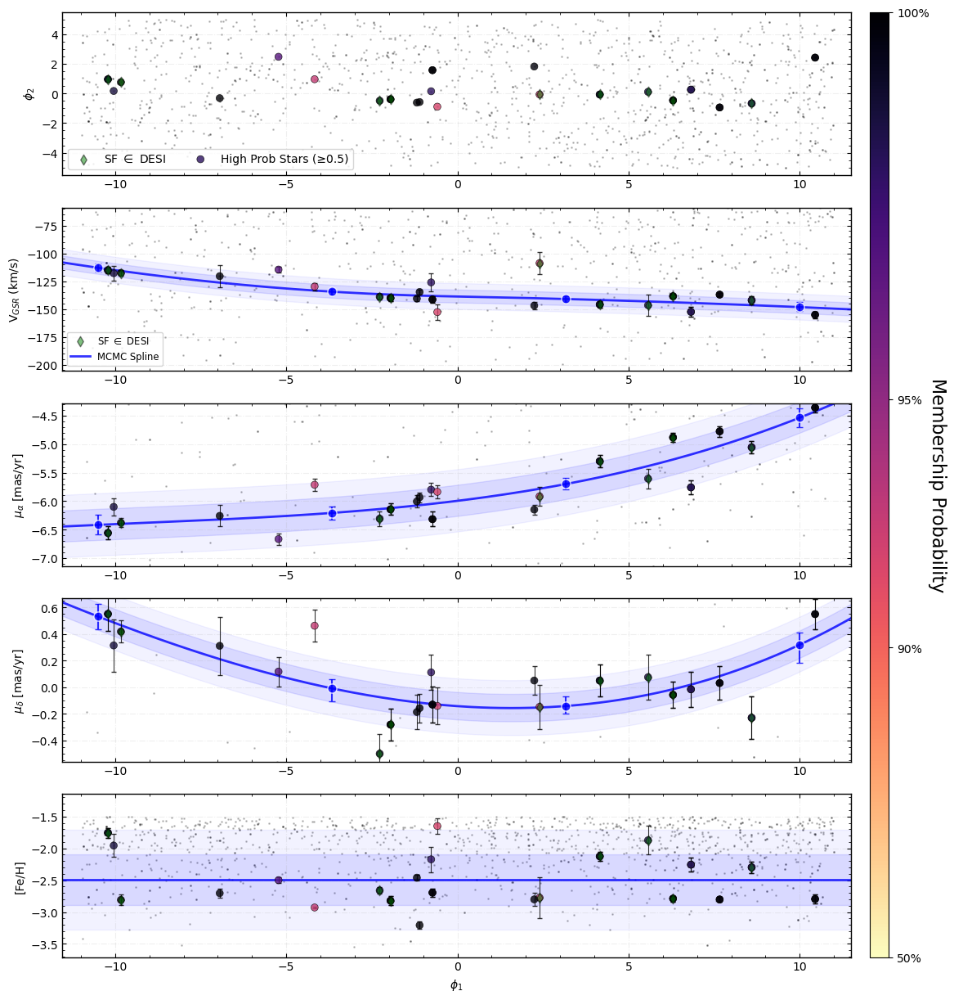

In [155]:
importlib.reload(st)
# %matplotlib inline
plt_enhanced = st.StreamPlotter(MCMeta) 
plt_enhanced.plot_params['sf_in_desi']['alpha'] = 0.5
plt_enhanced.plot_params['sf_in_desi']['zorder'] = 10
plt_enhanced.plot_params['background']['alpha'] = 0.2
plt_enhanced.plot_params['background']['s'] = 1
plt_enhanced.plot_params['optimized_spline_line']['lw'] = 1
plt_enhanced.plot_params['initial_spline_line']['lw'] = 1
plt_enhanced.plot_params['membership_scatter']['s'] = 40

fig, ax = plt_enhanced.sixD_plot(
    showStream=True, 
    show_sf_only=False, 
    background=True,
    show_initial_splines=False,
    show_optimized_splines=False,
    show_sf_errors=False,
    show_mcmc_splines=True,
    show_membership_prob=True, stream_prob=stream_prob, min_prob=min_prob, show_residuals=False, mcmc_object=mcmc,
)
# ax[0].set_ylim(-6, 6)
# ax[2].set_ylim(-10, -2)
# ax[3].set_ylim(-5, 5)
# plt.tight_layout()

# overlay galstream tracks

plt.show()

In [156]:
mcmc.save_run()

Saved 31 high-probability members to: ./runs/C-23-I24_260223_testTrue/C-23-I24_phi2_spline_50%_mem.fits
Saved 1279 total stars to: ./runs/C-23-I24_260223_testTrue/C-23-I24_phi2_spline_all%_mem.fits
Saved run metrics to: ./runs/C-23-I24_260223_testTrue/metrics.txt
